### Exploration
Exploratory analysis of the two h5ad files generated in XYZeq.

In [302]:
import scanpy as sc
import pandas as pd 
import numpy as np
from scipy.sparse import csr_matrix
import matplotlib.pyplot as plt
from nero import Harmonia
from tqdm import tqdm_notebook as tqdm
import warnings
import itertools as it
import pickle as pkl
import os
from copy import copy
import warnings

In [303]:
# might need this, the most recent version of jupterlab I installed installed the most recent version of jedi which has been having problems with autocomplete
# see thread here: https://github.com/ipython/ipython/issues/10493
%config Completer.use_jedi = False

In [304]:
sc.settings.verbosity = 3
sc.settings.set_figure_params(dpi=80)

In [309]:
exps = dict()
for exp in [i.split('.raw')[0] for i in sorted(os.listdir('/myvol/data2/10x/'))]:
    exps[exp] = dict()

In [310]:
for exp in [i.split('.raw')[0] for i in os.listdir('/myvol/data2/10x/')]:
    exps[exp]['path'] = '/myvol/data2/10x/%s.raw.h5' % exp

In [307]:
del exps['1.1']
del exps['1.2']
del exps['2.3']

In [311]:
exps

{'1.1': {'path': '/myvol/data2/10x/1.1.raw.h5'},
 '1.2': {'path': '/myvol/data2/10x/1.2.raw.h5'},
 '2.1': {'path': '/myvol/data2/10x/2.1.raw.h5'},
 '2.2': {'path': '/myvol/data2/10x/2.2.raw.h5'},
 '2.3': {'path': '/myvol/data2/10x/2.3.raw.h5'},
 '2.4': {'path': '/myvol/data2/10x/2.4.raw.h5'}}

In [312]:
for exp in exps:
    warnings.filterwarnings('ignore')
    exps[exp]['adata'] = sc.read_10x_h5(exps[exp]['path'], genome='mm10')
    sc.utils.view_to_actual(exps[exp]['adata'])
    exps[exp]['adata'].var_names_make_unique()
    warnings.filterwarnings('default')

reading /myvol/data2/10x/1.1.raw.h5


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


 (0:00:00)
reading /myvol/data2/10x/1.2.raw.h5


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


 (0:00:00)
reading /myvol/data2/10x/2.1.raw.h5


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


 (0:00:08)


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


reading /myvol/data2/10x/2.2.raw.h5


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


 (0:00:08)


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


reading /myvol/data2/10x/2.3.raw.h5


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


 (0:00:08)


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


reading /myvol/data2/10x/2.4.raw.h5


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


 (0:00:08)


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Read in the files:

Plot the distributions, samples are rows.

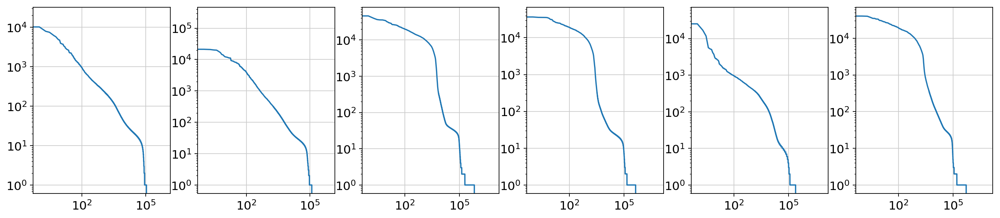

In [313]:
fig, axes = plt.subplots(1,6,figsize=(20,4))
for exp, ax in zip(exps, np.ravel(axes)):
    ax.plot(np.sort(np.ravel(exps[exp]['adata'].X.sum(1)))[::-1])
    ax.set_xscale('log')
    ax.set_yscale('log')

In [10]:
cells = [4500, 2500, 2500] # just 2.1 2.2 2.4

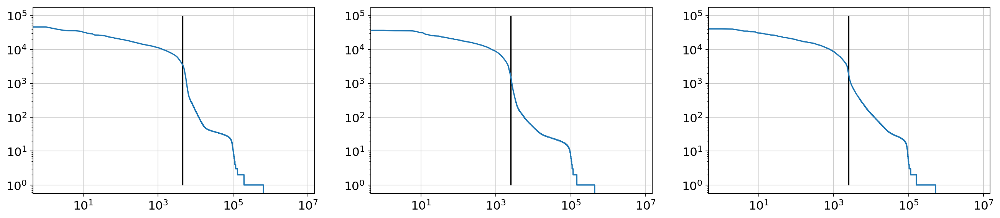

In [11]:
fig, axes = plt.subplots(1,3,figsize=(20,4))
for exp, ax, cell in zip(exps, np.ravel(axes), cells):
    ax.plot(np.sort(np.ravel(exps[exp]['adata'].X.sum(1)))[::-1])
    ax.set_xscale('log')
    ax.set_yscale('log')
    ax.vlines(cell,1,1e5);

In [12]:
for exp in exps:
    obs = exps[exp]['adata'].obs.copy()
    obs['n_counts'] = np.ravel(exps[exp]['adata'].X.sum(1))
    exps[exp]['obs_n_counts'] = obs

In [13]:
for exp, cell in zip(exps, cells):
    exps[exp]['cell_number'] = cell

In [14]:
for exp in exps:
    exps[exp]['adata'] = exps[exp]['adata'][exps[exp]['obs_n_counts'].sort_values('n_counts', ascending=False)[:exps[exp]['cell_number']].index.values,:].copy()

In [15]:
adata_ori = exps['2.1']['adata'].concatenate(exps['2.2']['adata'],exps['2.4']['adata'])

In [16]:
adata = adata_ori.copy()

In [17]:
genelist_human = adata.var_names.tolist()
genelist_mouse = adata.var_names.tolist()

mito_genes_names_mouse = [gn for gn in genelist_mouse if gn.startswith('mt-')]

mito_genes_mouse = [genelist_mouse.index(gn) for gn in mito_genes_names_mouse]

Store percent mito in each sample:

In [18]:
adata.obs['percent_mito'] = np.ravel(np.sum(adata[:, mito_genes_mouse].X, axis=1)) / np.ravel(np.sum(adata.X, axis=1))

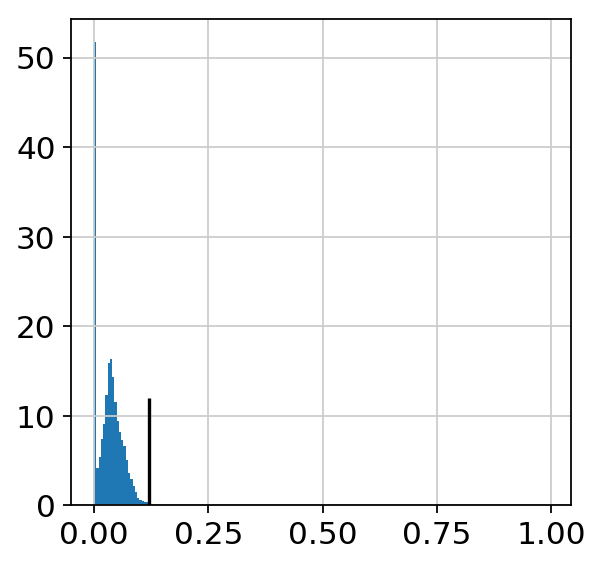

In [19]:
plt.hist(adata.obs['percent_mito'].values,bins=200,density=True);
plt.vlines(0.12,0,12);

In [20]:
adata = adata[adata.obs['percent_mito'] < 0.12].copy()

In [21]:
def my_plot(ax, vals, tupe=None, thresh=None, max_y=None, low=1e-1, hi=2e5):
    ax.hist(vals,bins=np.logspace(np.log10(low),np.log10(hi), 500),color='gray') # logspace bins looks great!
    ax.set_yscale('log')
    ax.set_xscale('log')
    ax.set_title(tupe)
    ax.grid(which='both', alpha=0.5)
    if thresh != None:
        ax.vlines(thresh,0,max_y)
    return

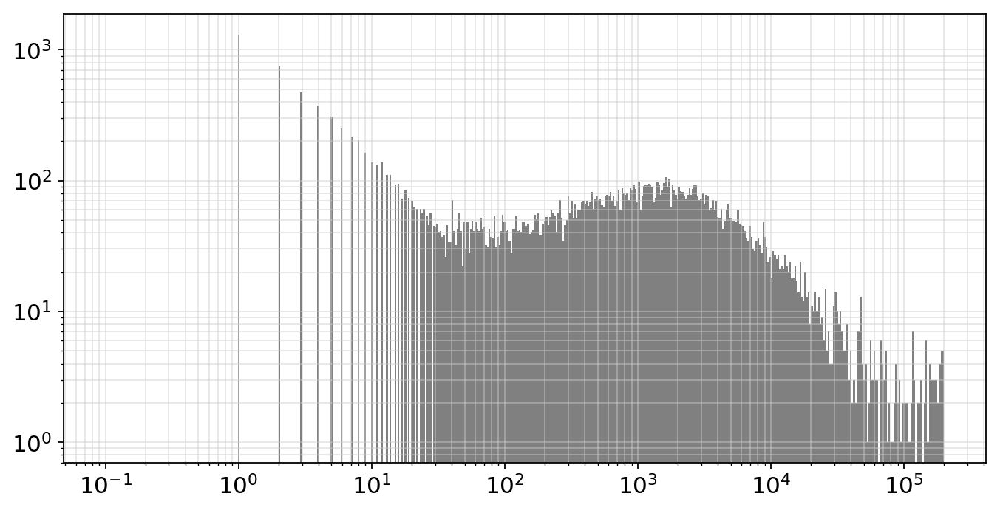

In [22]:
fig, ax = plt.subplots(figsize=(10,5))
vals = sc.pp.filter_genes(adata, min_counts=0, inplace=False)[1] # total number of UMIs observed
my_plot(ax, vals)

In [23]:
sc.pp.filter_genes(adata, min_counts=80, inplace=True)

filtered out 16811 genes that are detectedin less than 80 counts


In [24]:
sc.pp.log1p(adata)
sc.pp.normalize_per_cell(adata)

normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


In [25]:
warnings.filterwarnings('ignore')
sc.pp.combat(adata)
warnings.filterwarnings('default')

... storing 'feature_types' as categorical
... storing 'genome' as categorical


Standardizing Data across genes.

Found 3 batches

Found 0 numerical variables:
	

Fitting L/S model and finding priors

Finding parametric adjustments

Adjusting data



In [26]:
warnings.filterwarnings('ignore')
sc.pp.highly_variable_genes(adata, flavor='cell_ranger',inplace=True) # use default setting first to visualize
warnings.filterwarnings('default')
a = sum(adata.var['highly_variable'].values)
print(a, a/len(adata.var_names))

extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
6055 0.5412532403682846


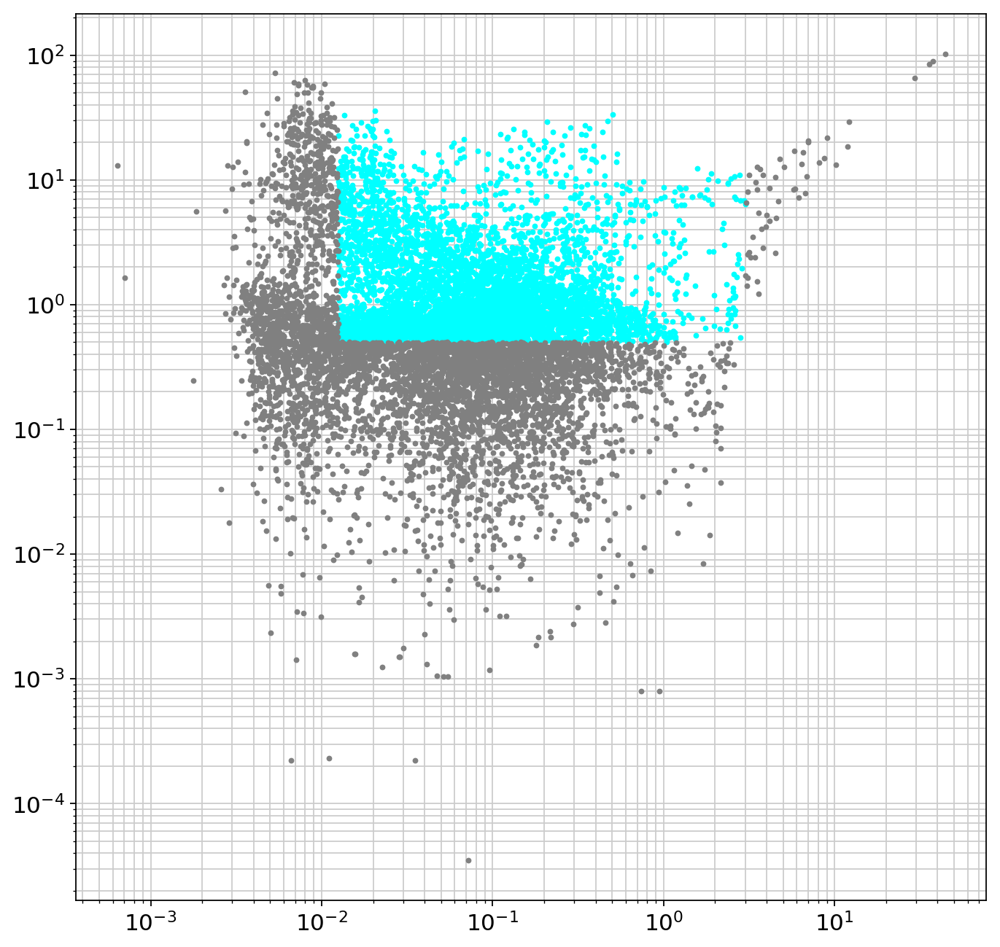

In [27]:
plt.figure(figsize=(10,10))
hv = adata[:,adata.var['highly_variable'] == True].copy()
nhv = adata[:,adata.var['highly_variable'] == False].copy()
plt.plot(hv.var['means'].values,hv.var['dispersions_norm'].values,marker='.', markersize=5, linewidth=0, color='cyan');
plt.plot(nhv.var['means'].values,nhv.var['dispersions_norm'].values,marker='.', markersize=5, linewidth=0, color='grey');
plt.yscale('log')
plt.xscale('log')
plt.grid(True,'both','both')

In [28]:
min_mean = 3e-2
min_disp = 7e-1

In [29]:
warnings.filterwarnings('ignore')
sc.pp.highly_variable_genes(adata, flavor='cell_ranger',inplace=True, min_mean=min_mean, min_disp=min_disp, max_mean=np.inf) # use default setting first to visualize
warnings.filterwarnings('default')
a = sum(adata.var['highly_variable'].values)
print(a, a/len(adata.var_names))

extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
3604 0.3221596495932779


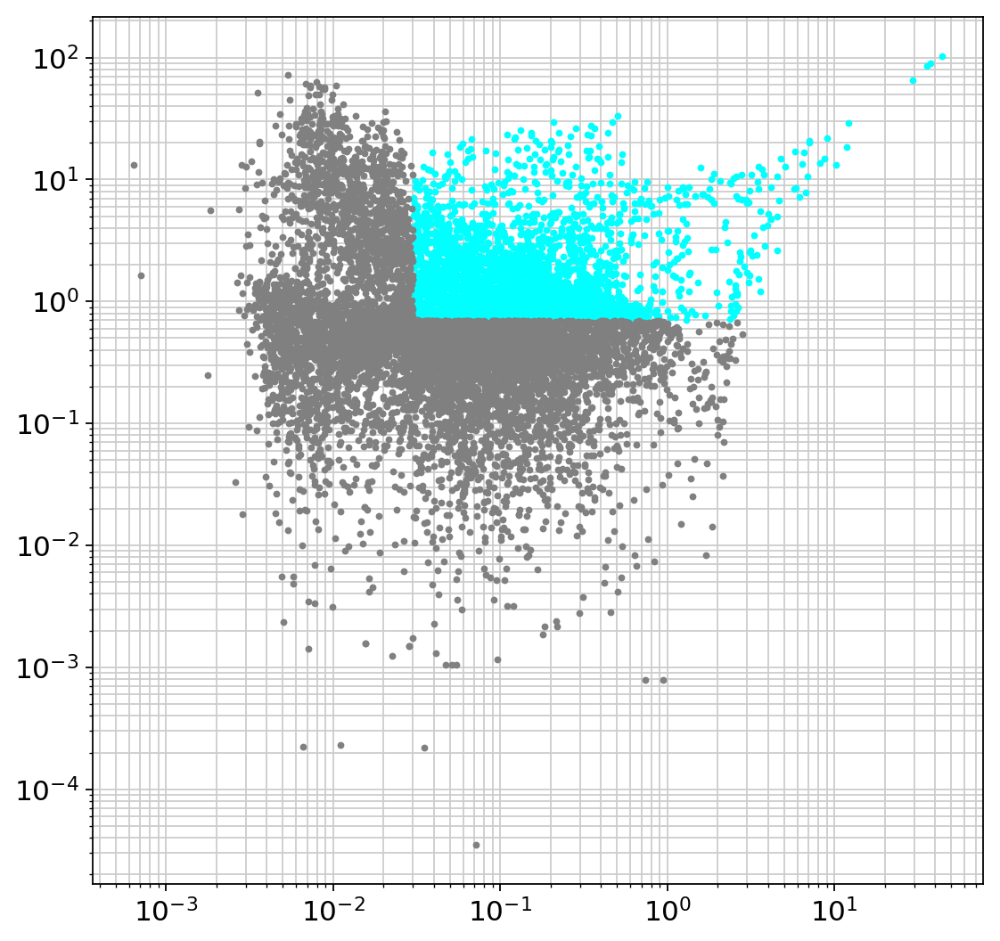

In [30]:
plt.figure(figsize=(8,8))
hv = adata[:,adata.var['highly_variable'] == True].copy()
nhv = adata[:,adata.var['highly_variable'] == False].copy()
plt.plot(hv.var['means'].values,hv.var['dispersions_norm'].values,marker='.', markersize=5, linewidth=0, color='cyan');
plt.plot(nhv.var['means'].values,nhv.var['dispersions_norm'].values,marker='.', markersize=5, linewidth=0, color='grey');
plt.yscale('log')
plt.xscale('log')
plt.grid(True,'both','both')

Cool, seems reasonable.

In [31]:
warnings.filterwarnings('ignore')
sc.pp.highly_variable_genes(adata, flavor='cell_ranger',inplace=True, subset=True, min_mean=min_mean, min_disp=min_disp, max_mean=np.inf) # use default setting first to visualize
warnings.filterwarnings('default')

extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


In [32]:
warnings.filterwarnings('ignore')
sc.pp.regress_out(adata,['percent_mito','n_counts'],n_jobs=8)
warnings.filterwarnings('default')
sc.pp.scale(adata, max_value=10)

regressing out ['percent_mito', 'n_counts']
    finished (0:00:27)


# Dim Reduction

Note that scikit-learn's randomized PCA might not be exactly reproducible across different computational platforms. For exact reproducibility, choose `svd_solver='arpack'.` This will likely become the Scanpy default in the future.
computing PCA with n_comps = 100
computing PCA on highly variable genes


/usr/lib/python3.6/importlib/_bootstrap.py:219: RuntimeWarning: numpy.ufunc size changed, may indicate binary incompatibility. Expected 192 from C header, got 216 from PyObject
  return f(*args, **kwds)


    finished (0:00:01)


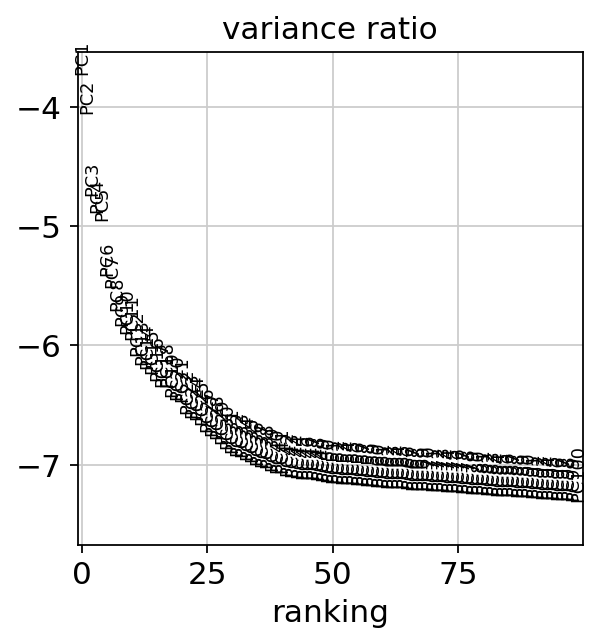

In [33]:
sc.pp.pca(adata,n_comps=100)
sc.pl.pca_variance_ratio(adata,log=True, n_pcs=100)

In [34]:
warnings.filterwarnings('ignore')
sc.pp.neighbors(adata,n_neighbors=15,n_pcs=45) # numba warning outlined here is not to be of concern: https://github.com/lmcinnes/umap/issues/252
warnings.filterwarnings('default')
sc.tl.leiden(adata,resolution=0.4)
sc.tl.umap(adata)#, min_dist=.05, spread=5, alpha=2)

computing neighbors
    using 'X_pca' with n_pcs = 45
    finished: added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix (0:00:08)
running Leiden clustering
    finished: found 13 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:01)
computing UMAP


/usr/local/lib/python3.6/dist-packages/umap/spectral.py:229: UserWarning: Embedding a total of 2 separate connected components using meta-embedding (experimental)
  n_components


    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:25)


In [35]:
# sc.tl.leiden(adata,resolution=0.4)

### UMAP 1

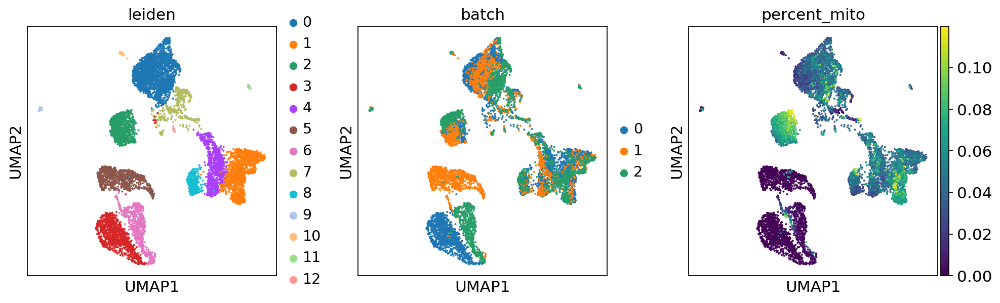

In [36]:
sc.pl.umap(adata,color=['leiden','batch','percent_mito'])

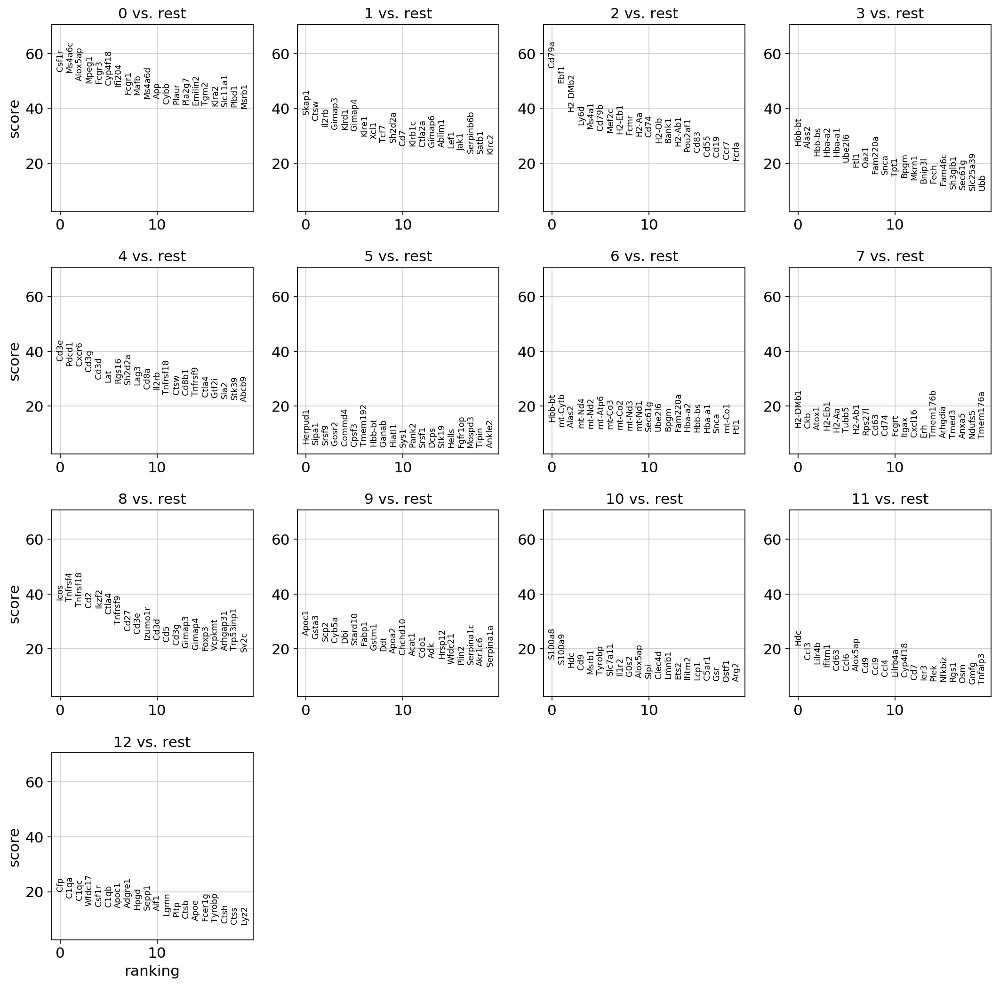

In [37]:
sc.settings.verbosity = 0
warnings.filterwarnings('ignore')
sc.tl.rank_genes_groups(adata,groupby='leiden')
warnings.filterwarnings('default')
sc.pl.rank_genes_groups(adata)
sc.settings.verbosity = 3

In [38]:
cts = list()
for i in adata.obs['leiden']:
    if i in ['5','6','3']:
        cts.append('ct1')
    elif i in ['1','4','8']:
        cts.append('ct2')
    elif i in ['12','7']:
        cts.append('ct3')
    elif i in ['0']:
        cts.append('ct4')
    elif i in ['2']:
        cts.append('ct5')
    elif i in ['9']:
        cts.append('ct6')
    elif i in ['10']:
        cts.append('ct7')
    elif i in ['11']:
        cts.append('ct8')

adata.obs['cts'] = cts
adata.obs['cts'] = adata.obs['cts'].astype('category')

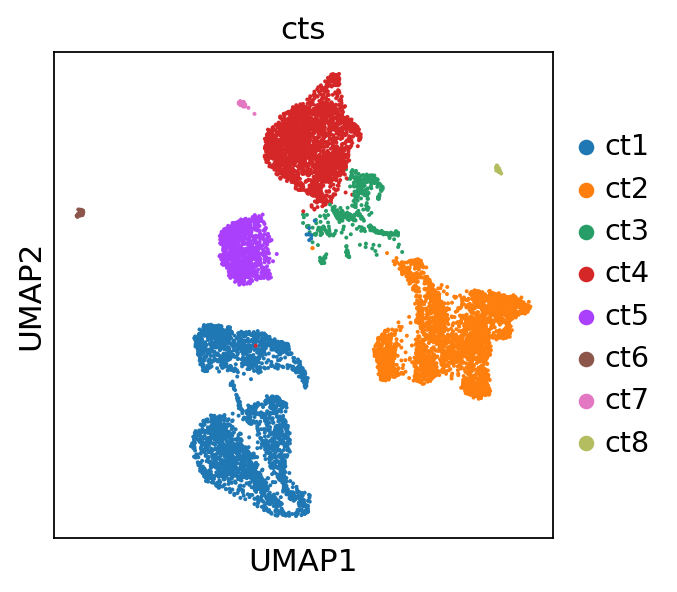

In [39]:
sc.pl.umap(adata, color='cts')

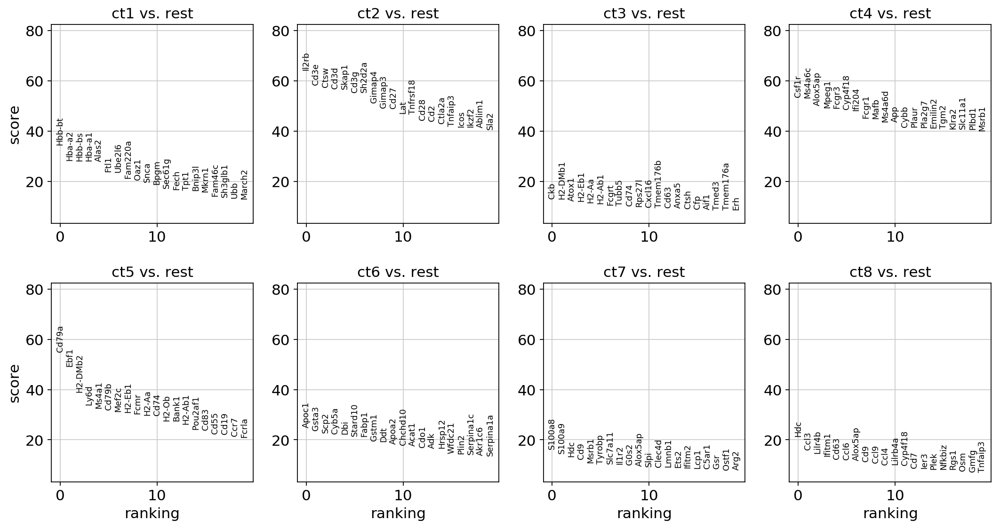

In [40]:
sc.settings.verbosity = 0 
warnings.filterwarnings('ignore')
sc.tl.rank_genes_groups(adata,groupby='cts')
warnings.filterwarnings('default')
sc.pl.rank_genes_groups(adata)
sc.settings.verbosity = 3

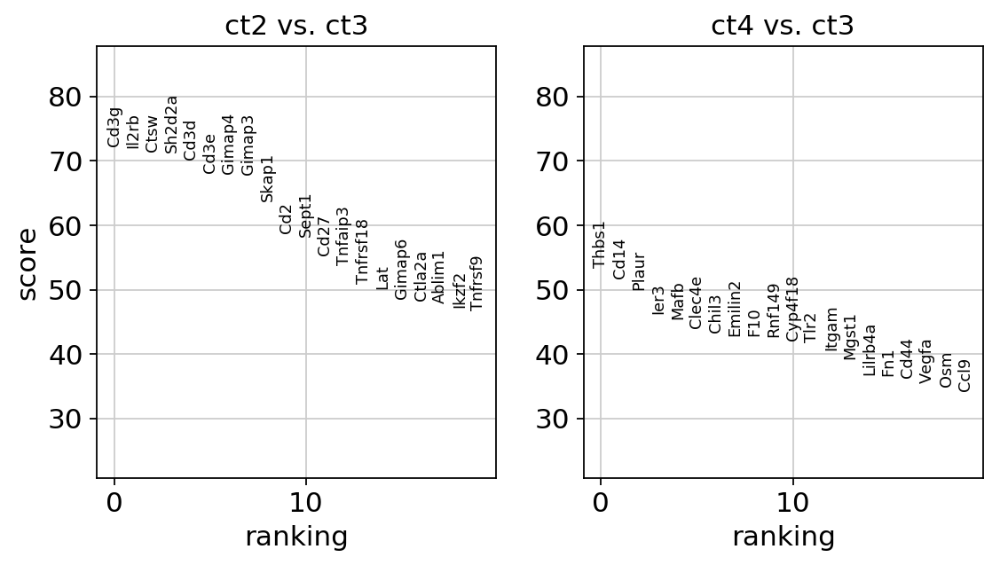

In [41]:
sc.settings.verbosity = 0
warnings.filterwarnings('ignore')
sc.tl.rank_genes_groups(adata,groupby='cts', groups=['ct2','ct4'],reference='ct3')
warnings.filterwarnings('default')
sc.pl.rank_genes_groups(adata)
sc.settings.verbosity = 3

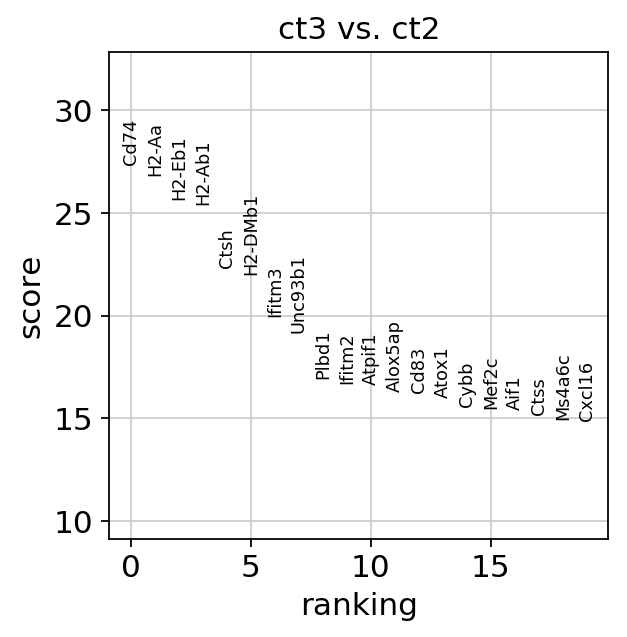

In [42]:
sc.settings.verbosity = 0
warnings.filterwarnings('ignore')
sc.tl.rank_genes_groups(adata,groupby='cts', groups=['ct3'],reference='ct2')
warnings.filterwarnings('default')
sc.pl.rank_genes_groups(adata)
sc.settings.verbosity = 3

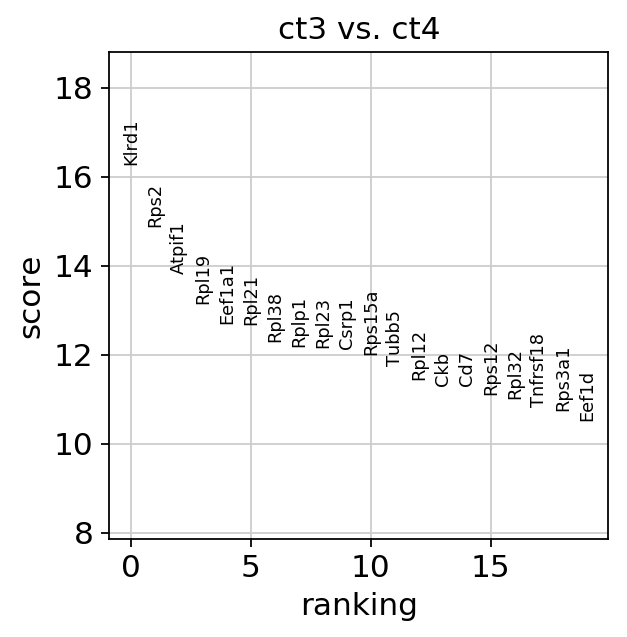

In [43]:
sc.settings.verbosity = 0
warnings.filterwarnings('ignore')
sc.tl.rank_genes_groups(adata,groupby='cts', groups=['ct3'],reference='ct4')
warnings.filterwarnings('default')
sc.pl.rank_genes_groups(adata)
sc.settings.verbosity = 3

**ct1:** has to be the liver cells, right? I'm seeing just a ton of blood and marrow erythrocyte markers

**ct2:** T1, will subcluster

**ct3:** T2, will subcluster

**ct4:** has to be the cancer cells, right? I'm seeing myeloid/Kupffer cell markers

**ct6:** The only population with actual hepatocyte markers

**ct7:** Neutrophils (S100a8, S100a9 + Hdc)

**ct8:** Mast cells (Hdc + chemokine ligands)

# ADATA2 and ADATA3

In [44]:
adata2 = adata_ori[adata[adata.obs['cts'] == 'ct2'].obs_names.values].copy()
adata3 = adata_ori[adata[adata.obs['cts'] == 'ct3'].obs_names.values].copy()

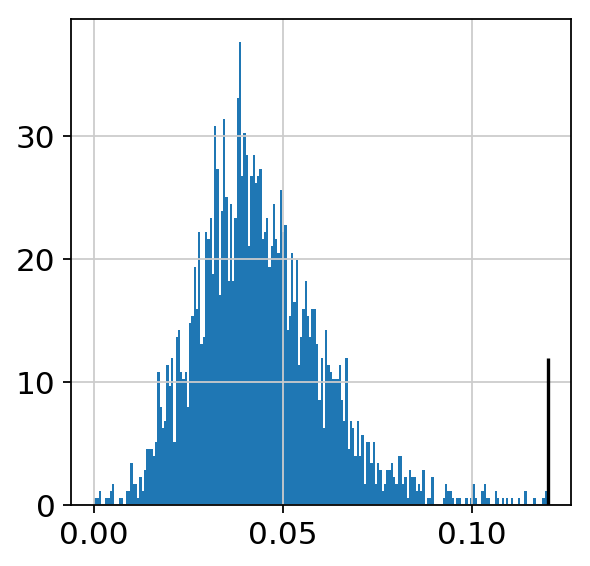

In [46]:
adata2.obs['percent_mito'] = np.ravel(np.sum(adata2[:, mito_genes_mouse].X, axis=1)) / np.ravel(np.sum(adata2.X, axis=1))

plt.hist(adata2.obs['percent_mito'].values,bins=200,density=True);
plt.vlines(0.12,0,12);

adata2 = adata2[adata2.obs['percent_mito'] < 0.12].copy()

def my_plot(ax, vals, tupe=None, thresh=None, max_y=None, low=1e-1, hi=2e5):
    ax.hist(vals,bins=np.logspace(np.log10(low),np.log10(hi), 500),color='gray') # logspace bins looks great!
    ax.set_yscale('log')
    ax.set_xscale('log')
    ax.set_title(tupe)
    ax.grid(which='both', alpha=0.5)
    if thresh != None:
        ax.vlines(thresh,0,max_y)
    return

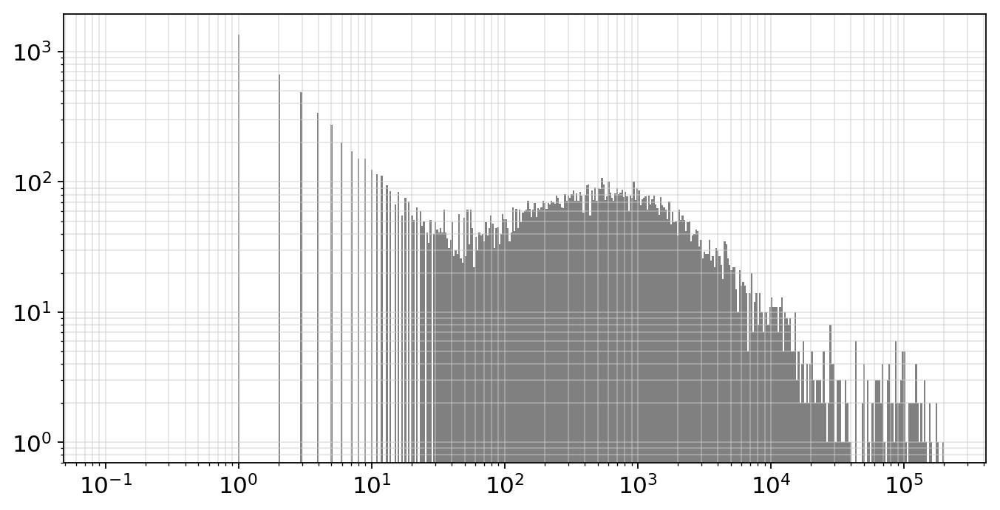

In [47]:
fig, ax = plt.subplots(figsize=(10,5))
vals = sc.pp.filter_genes(adata2, min_counts=0, inplace=False)[1] # total number of UMIs observed
my_plot(ax, vals)

In [48]:
sc.pp.filter_genes(adata2, min_counts=80, inplace=True)

filtered out 18615 genes that are detectedin less than 80 counts


In [49]:
sc.pp.log1p(adata2)
sc.pp.normalize_per_cell(adata2)

normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


In [50]:
warnings.filterwarnings('ignore')
sc.pp.combat(adata2)
warnings.filterwarnings('default')

... storing 'feature_types' as categorical
... storing 'genome' as categorical


Standardizing Data across genes.

Found 3 batches

Found 0 numerical variables:
	

Fitting L/S model and finding priors

Finding parametric adjustments

Adjusting data



In [51]:
warnings.filterwarnings('ignore')
sc.pp.highly_variable_genes(adata2, flavor='cell_ranger',inplace=True) # use default setting first to visualize
warnings.filterwarnings('default')
a = sum(adata2.var['highly_variable'].values)
print(a, a/len(adata2.var_names))

extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
5718 0.6093999786848556


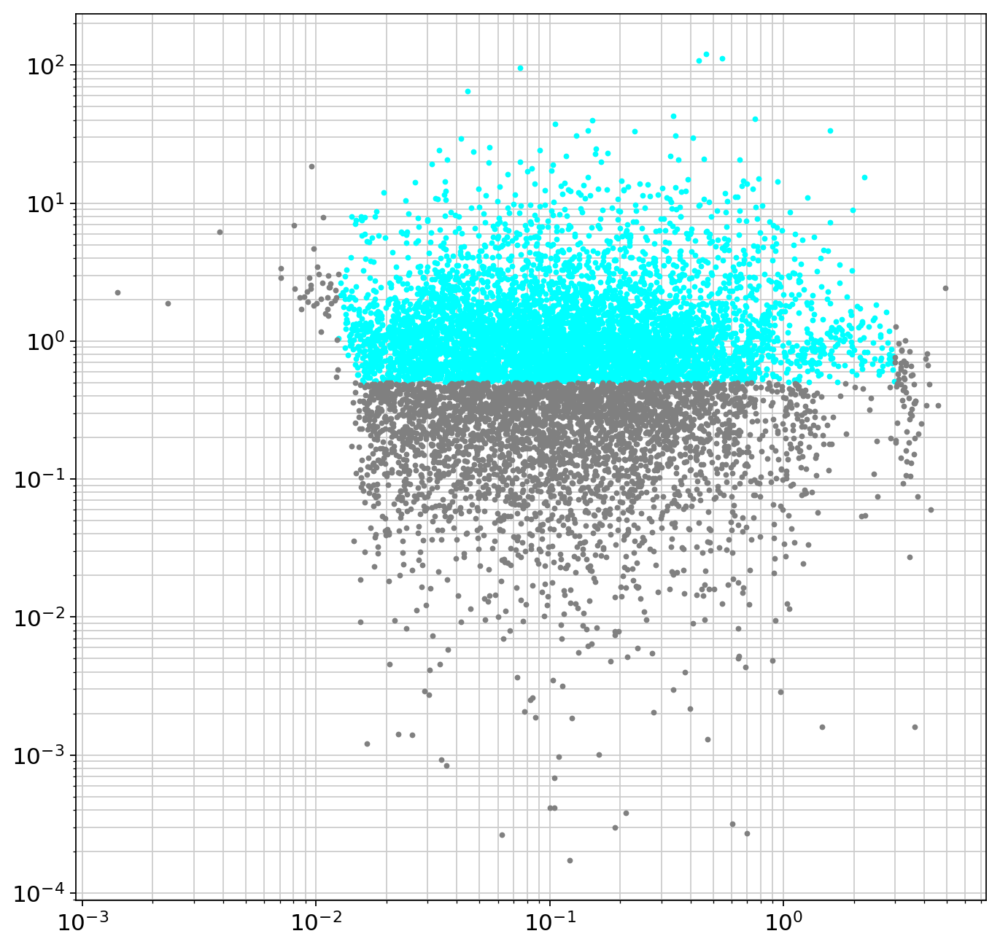

In [52]:
plt.figure(figsize=(10,10))
hv = adata2[:,adata2.var['highly_variable'] == True].copy()
nhv = adata2[:,adata2.var['highly_variable'] == False].copy()
plt.plot(hv.var['means'].values,hv.var['dispersions_norm'].values,marker='.', markersize=5, linewidth=0, color='cyan');
plt.plot(nhv.var['means'].values,nhv.var['dispersions_norm'].values,marker='.', markersize=5, linewidth=0, color='grey');
plt.yscale('log')
plt.xscale('log')
plt.grid(True,'both','both')

In [53]:
min_mean = 1e-1
min_disp = 5e-1

In [54]:
warnings.filterwarnings('ignore')
sc.pp.highly_variable_genes(adata2, flavor='cell_ranger',inplace=True, min_mean=min_mean, min_disp=min_disp, max_mean=np.inf) # use default setting first to visualize
warnings.filterwarnings('default')
a = sum(adata2.var['highly_variable'].values)
print(a, a/len(adata2.var_names))

extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
3179 0.3388042203985932


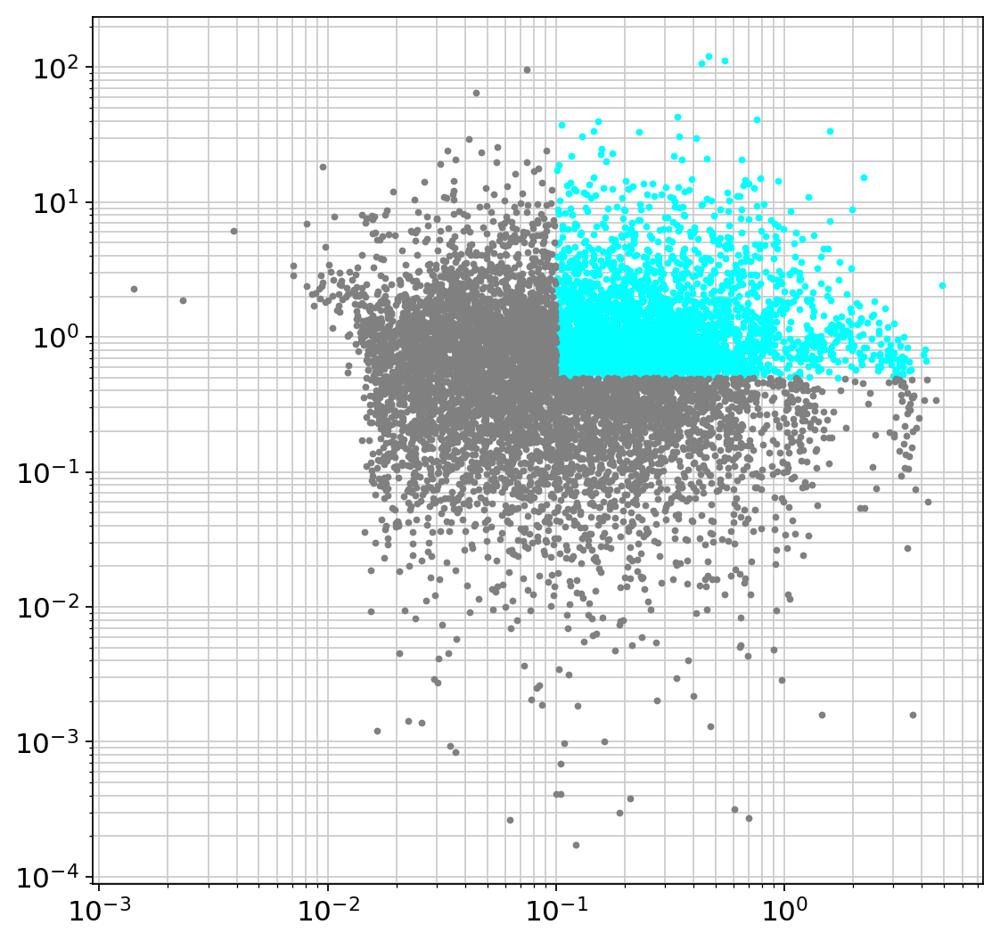

In [55]:
plt.figure(figsize=(8,8))
hv = adata2[:,adata2.var['highly_variable'] == True].copy()
nhv = adata2[:,adata2.var['highly_variable'] == False].copy()
plt.plot(hv.var['means'].values,hv.var['dispersions_norm'].values,marker='.', markersize=5, linewidth=0, color='cyan');
plt.plot(nhv.var['means'].values,nhv.var['dispersions_norm'].values,marker='.', markersize=5, linewidth=0, color='grey');
plt.yscale('log')
plt.xscale('log')
plt.grid(True,'both','both')

Cool, seems reasonable.

In [56]:
warnings.filterwarnings('ignore')
sc.pp.highly_variable_genes(adata2, flavor='cell_ranger',inplace=True, subset=True, min_mean=min_mean, min_disp=min_disp, max_mean=np.inf) # use default setting first to visualize
warnings.filterwarnings('default')

extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


In [57]:
warnings.filterwarnings('ignore')
sc.pp.regress_out(adata2,['percent_mito','n_counts'],n_jobs=8)
warnings.filterwarnings('default')
sc.pp.scale(adata2, max_value=10)

regressing out ['percent_mito', 'n_counts']
    finished (0:00:02)


# Dim Reduction

Note that scikit-learn's randomized PCA might not be exactly reproducible across different computational platforms. For exact reproducibility, choose `svd_solver='arpack'.` This will likely become the Scanpy default in the future.
computing PCA with n_comps = 100
computing PCA on highly variable genes
    finished (0:00:00)


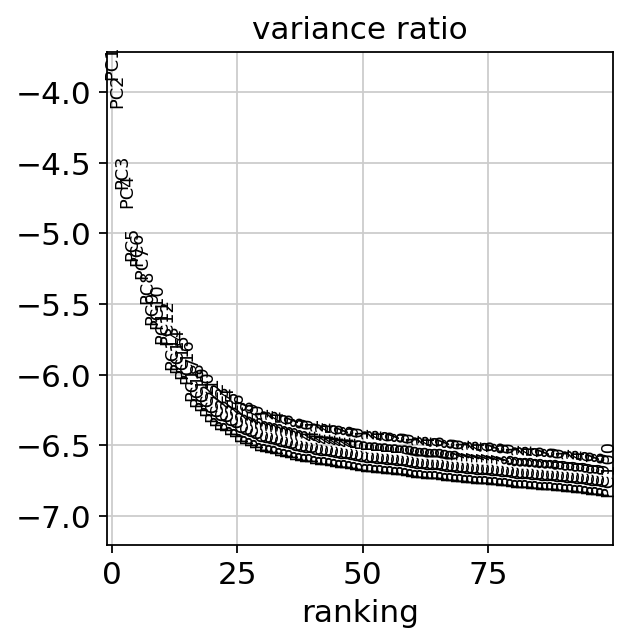

In [58]:
sc.pp.pca(adata2,n_comps=100)
sc.pl.pca_variance_ratio(adata2,log=True, n_pcs=100)

In [84]:
warnings.filterwarnings('ignore')
sc.pp.neighbors(adata2,n_neighbors=15,n_pcs=35) # numba warning outlined here is not to be of concern: https://github.com/lmcinnes/umap/issues/252
warnings.filterwarnings('default')
sc.tl.leiden(adata2,resolution=0.4)
sc.tl.umap(adata2)#, min_dist=.05, spread=5, alpha=2)

computing neighbors
    using 'X_pca' with n_pcs = 35
    finished: added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix (0:00:00)
running Leiden clustering
    finished: found 6 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:07)


In [86]:
sc.tl.leiden(adata2,resolution=0.8)

running Leiden clustering
    finished: found 9 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


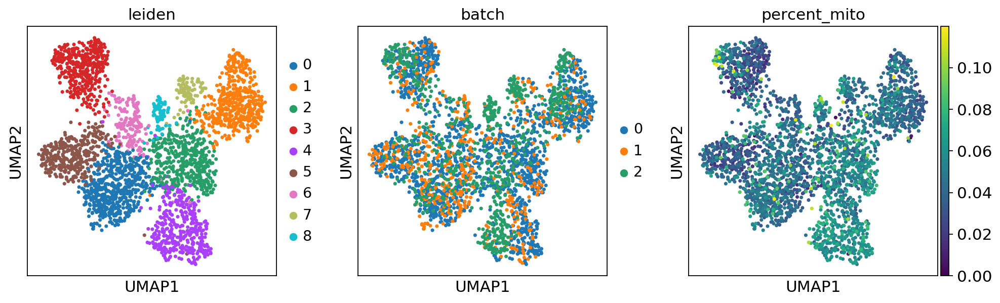

In [87]:
sc.pl.umap(adata2,color=['leiden','batch','percent_mito'])

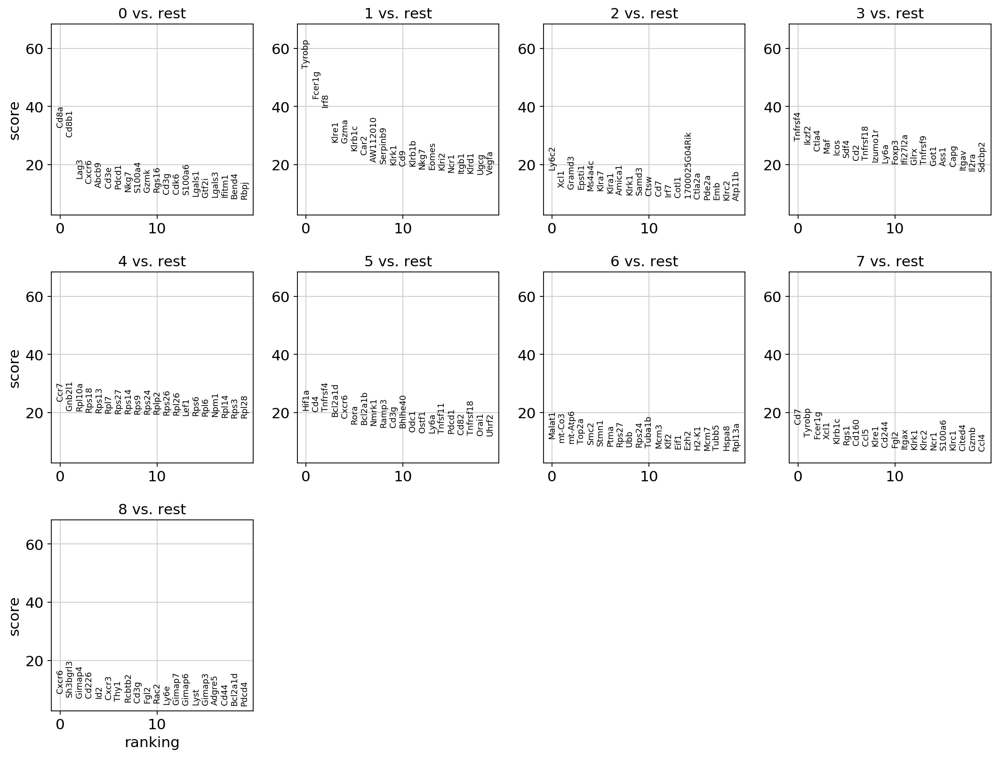

In [74]:
sc.settings.verbosity = 0 
warnings.filterwarnings('ignore')
sc.tl.rank_genes_groups(adata2,groupby='leiden')
warnings.filterwarnings('default')
sc.pl.rank_genes_groups(adata2)
sc.settings.verbosity = 3

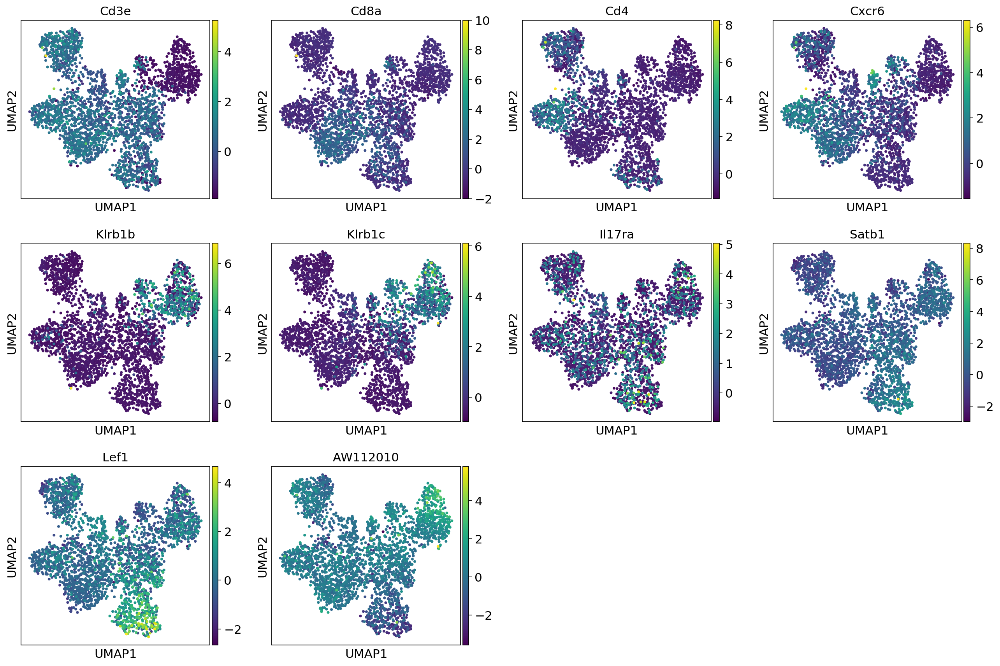

In [144]:
sc.pl.umap(adata2,color=['Cd3e','Cd8a','Cd4','Cxcr6','Klrb1b','Klrb1c','Il17ra','Satb1','Lef1','AW112010'])

### Thelper side
**3:** GranzymeB+ Treg (https://www.ncbi.nlm.nih.gov/pmc/articles/PMC3282434/)

**5:** Some naive-ish Cd4 T cell population https://www.ncbi.nlm.nih.gov/pubmed/23596313

**6:** Double negative-ish, memory T cells (Klf2 and S1pr1 aiding in trafficking and retention in non-lymphoid tissues (https://www.jimmunol.org/content/188/1_Supplement/173.16Malat) 1 expressed on T cells, no known function (https://www.ncbi.nlm.nih.gov/pubmed/30474472)

**0:** Cd8s, lag3 indicates activated, exhaustion phenotype?

### Cytotoxic-ish middle

**8:** Liver-specific NKT cells (iNKT)? 'https://www.pnas.org/content/106/46/19461'

**2:** Actiavted Cd8 T cells

**4:** Double positive, TCR triggered? (Gnb2l1 a.k.a. Rack1 https://www.ncbi.nlm.nih.gov/pmc/articles/PMC5081367/) COuld be progenitor population? (https://www.ncbi.nlm.nih.gov/pubmed/24836425)

### NK side

**7:** NKT population (Klrb1, Cd3, Cd8, https://www.ncbi.nlm.nih.gov/pmc/articles/PMC2665892/)

**1:** NK cells

In [147]:
adata3.obs['percent_mito'] = np.ravel(np.sum(adata3[:, mito_genes_mouse].X, axis=1)) / np.ravel(np.sum(adata3.X, axis=1))

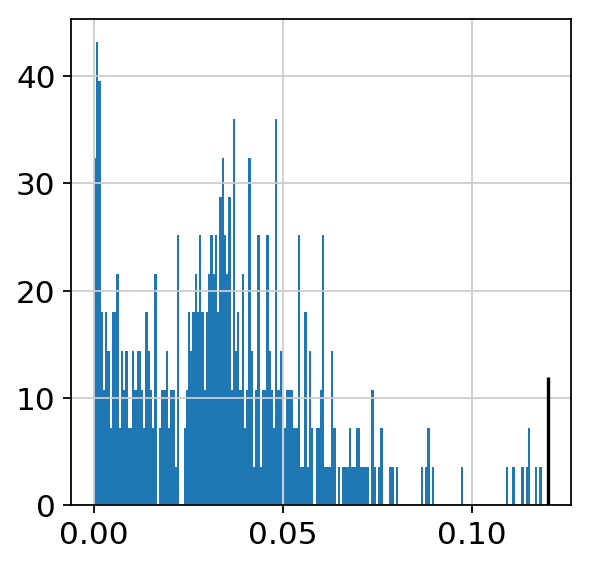

In [148]:
plt.hist(adata3.obs['percent_mito'].values,bins=200,density=True);
plt.vlines(0.12,0,12);

In [149]:
adata3 = adata3[adata3.obs['percent_mito'] < 0.12].copy()

In [150]:
def my_plot(ax, vals, tupe=None, thresh=None, max_y=None, low=1e-1, hi=2e5):
    ax.hist(vals,bins=np.logspace(np.log10(low),np.log10(hi), 500),color='gray') # logspace bins looks great!
    ax.set_yscale('log')
    ax.set_xscale('log')
    ax.set_title(tupe)
    ax.grid(which='both', alpha=0.5)
    if thresh != None:
        ax.vlines(thresh,0,max_y)
    return

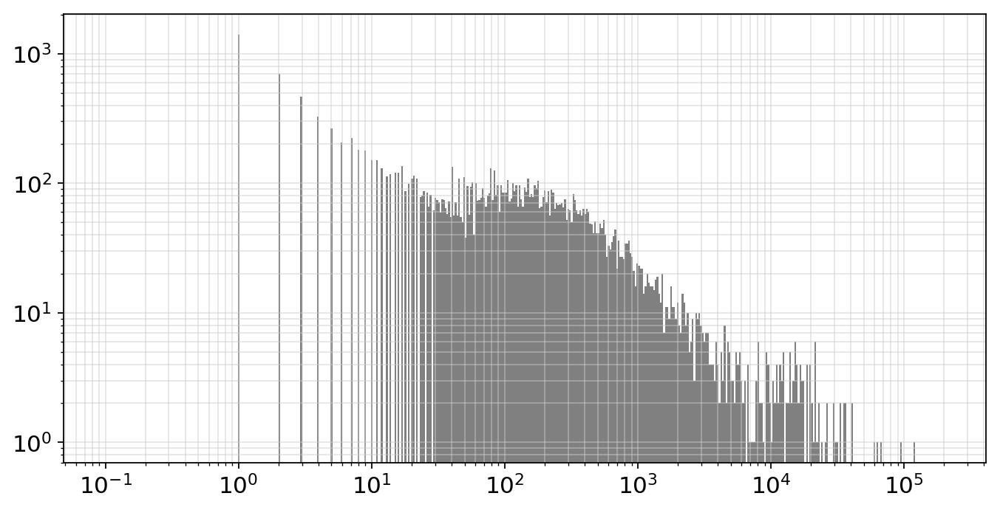

In [151]:
fig, ax = plt.subplots(figsize=(10,5))
vals = sc.pp.filter_genes(adata3, min_counts=0, inplace=False)[1] # total number of UMIs observed
my_plot(ax, vals)

In [152]:
sc.pp.filter_genes(adata3, min_counts=40, inplace=True)

filtered out 19850 genes that are detectedin less than 40 counts


In [153]:
sc.pp.log1p(adata3)
sc.pp.normalize_per_cell(adata3)

normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


In [154]:
warnings.filterwarnings('ignore')
sc.pp.combat(adata3)
warnings.filterwarnings('default')

... storing 'feature_types' as categorical
... storing 'genome' as categorical


Standardizing Data across genes.

Found 3 batches

Found 0 numerical variables:
	

Fitting L/S model and finding priors

Finding parametric adjustments

Adjusting data



In [155]:
warnings.filterwarnings('ignore')
sc.pp.highly_variable_genes(adata3, flavor='cell_ranger',inplace=True) # use default setting first to visualize
warnings.filterwarnings('default')
a = sum(adata3.var['highly_variable'].values)
print(a, a/len(adata3.var_names))

extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
5031 0.6174521354933726


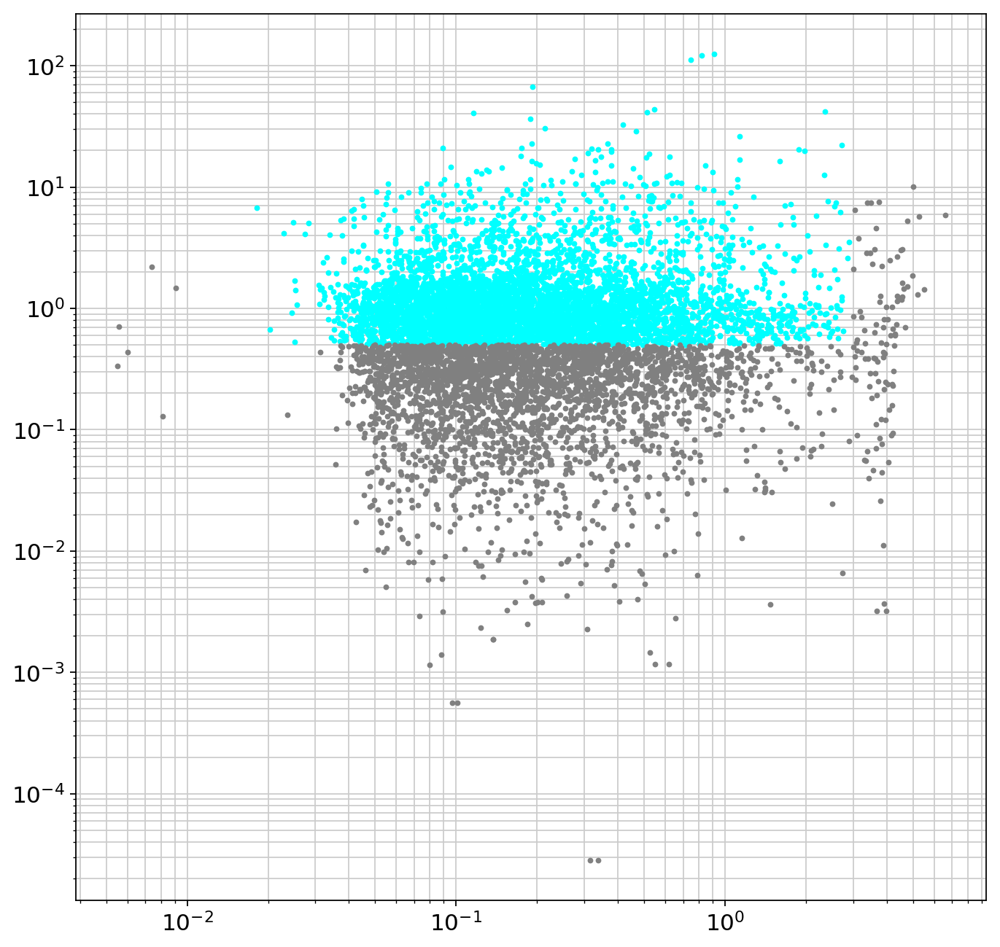

In [156]:
plt.figure(figsize=(10,10))
hv = adata3[:,adata3.var['highly_variable'] == True].copy()
nhv = adata3[:,adata3.var['highly_variable'] == False].copy()
plt.plot(hv.var['means'].values,hv.var['dispersions_norm'].values,marker='.', markersize=5, linewidth=0, color='cyan');
plt.plot(nhv.var['means'].values,nhv.var['dispersions_norm'].values,marker='.', markersize=5, linewidth=0, color='grey');
plt.yscale('log')
plt.xscale('log')
plt.grid(True,'both','both')

In [157]:
min_mean = 2e-1
min_disp = 5e-1

In [158]:
warnings.filterwarnings('ignore')
sc.pp.highly_variable_genes(adata3, flavor='cell_ranger',inplace=True, min_mean=min_mean, min_disp=min_disp, max_mean=np.inf) # use default setting first to visualize
warnings.filterwarnings('default')
a = sum(adata3.var['highly_variable'].values)
print(a, a/len(adata3.var_names))

extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
2287 0.2806823760432008


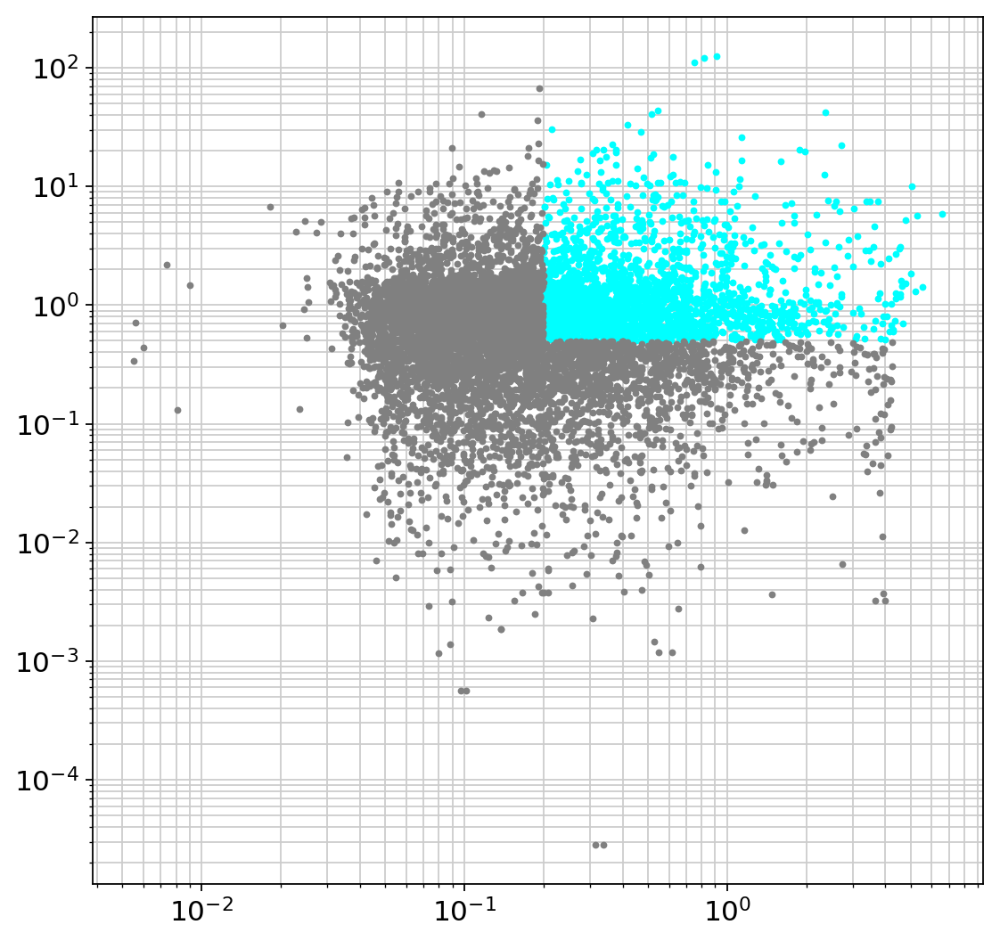

In [159]:
plt.figure(figsize=(8,8))
hv = adata3[:,adata3.var['highly_variable'] == True].copy()
nhv = adata3[:,adata3.var['highly_variable'] == False].copy()
plt.plot(hv.var['means'].values,hv.var['dispersions_norm'].values,marker='.', markersize=5, linewidth=0, color='cyan');
plt.plot(nhv.var['means'].values,nhv.var['dispersions_norm'].values,marker='.', markersize=5, linewidth=0, color='grey');
plt.yscale('log')
plt.xscale('log')
plt.grid(True,'both','both')

Cool, seems reasonable.

In [160]:
warnings.filterwarnings('ignore')
sc.pp.highly_variable_genes(adata3, flavor='cell_ranger',inplace=True, subset=True, min_mean=min_mean, min_disp=min_disp, max_mean=np.inf) # use default setting first to visualize
warnings.filterwarnings('default')

extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


In [161]:
warnings.filterwarnings('ignore')
sc.pp.regress_out(adata3,['percent_mito','n_counts'],n_jobs=8)
warnings.filterwarnings('default')
sc.pp.scale(adata3, max_value=10)

regressing out ['percent_mito', 'n_counts']
    finished (0:00:01)


# Dim Reduction

Note that scikit-learn's randomized PCA might not be exactly reproducible across different computational platforms. For exact reproducibility, choose `svd_solver='arpack'.` This will likely become the Scanpy default in the future.
computing PCA with n_comps = 100
computing PCA on highly variable genes
    finished (0:00:00)


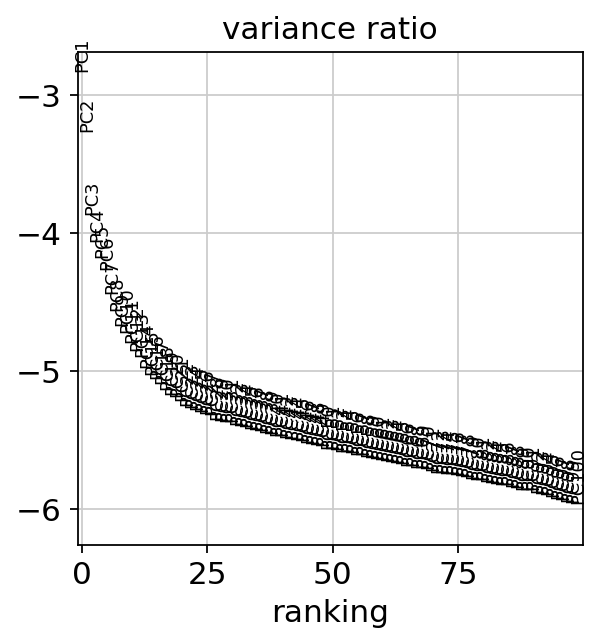

In [162]:
sc.pp.pca(adata3,n_comps=100)
sc.pl.pca_variance_ratio(adata3,log=True, n_pcs=100)

In [163]:
warnings.filterwarnings('ignore')
sc.pp.neighbors(adata3,n_neighbors=15,n_pcs=25) # numba warning outlined here is not to be of concern: https://github.com/lmcinnes/umap/issues/252
warnings.filterwarnings('default')
sc.tl.leiden(adata3,resolution=0.4)
sc.tl.umap(adata3)#, min_dist=.05, spread=5, alpha=2)

computing neighbors
    using 'X_pca' with n_pcs = 25
    finished: added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix (0:00:00)
running Leiden clustering
    finished: found 7 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:01)


In [166]:
sc.tl.leiden(adata3,resolution=0.3)

running Leiden clustering
    finished: found 6 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


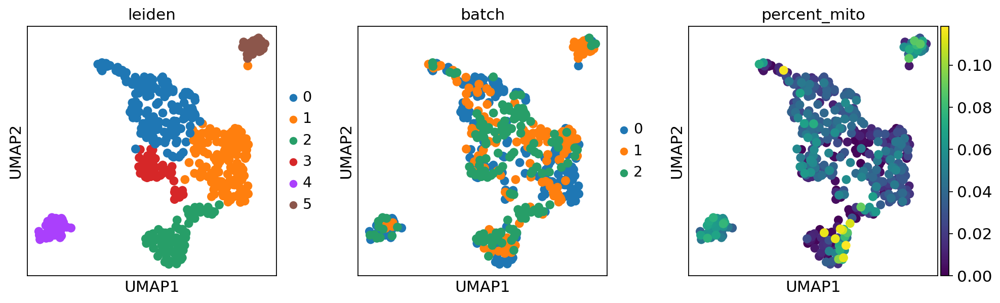

In [167]:
sc.pl.umap(adata3,color=['leiden','batch','percent_mito'])

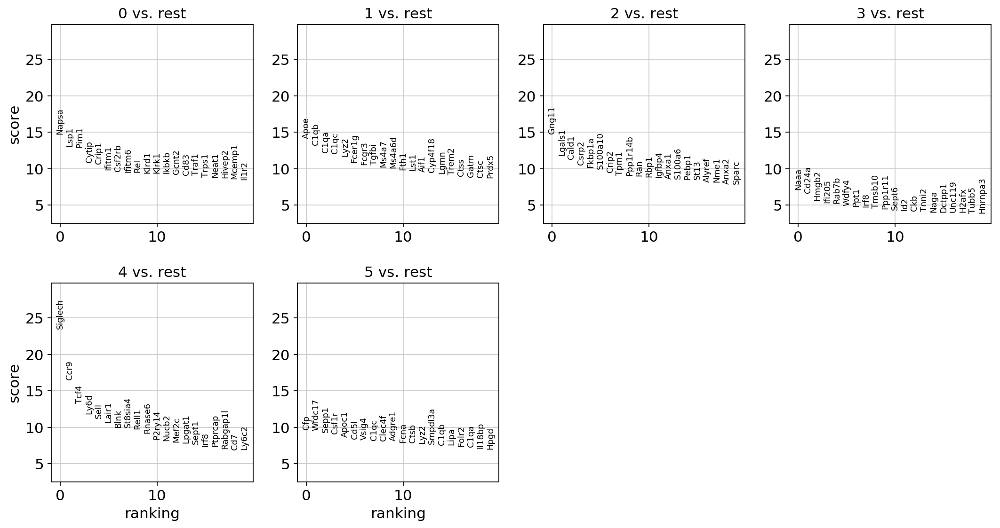

In [168]:
sc.settings.verbosity = 0 
warnings.filterwarnings('ignore')
sc.tl.rank_genes_groups(adata3,groupby='leiden')
warnings.filterwarnings('default')
sc.pl.rank_genes_groups(adata3)
sc.settings.verbosity = 3

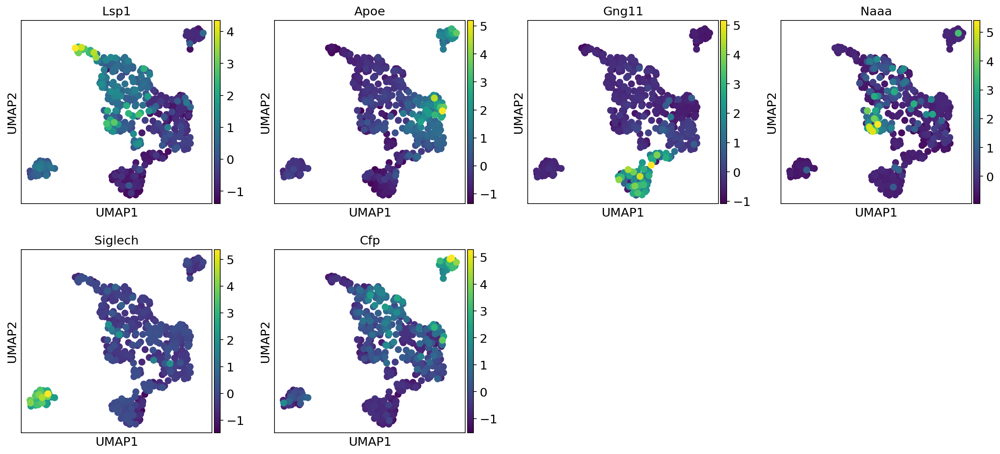

In [184]:
sc.pl.umap(adata3,color=['Lsp1','Apoe','Gng11','Naaa','Siglech','Cfp'])

# ADATA4 and ADATA5

In [186]:
adata4 = adata_ori[adata[adata.obs['cts'] == 'ct4'].obs_names.values].copy()
adata5 = adata_ori[adata[adata.obs['cts'] == 'ct5'].obs_names.values].copy()

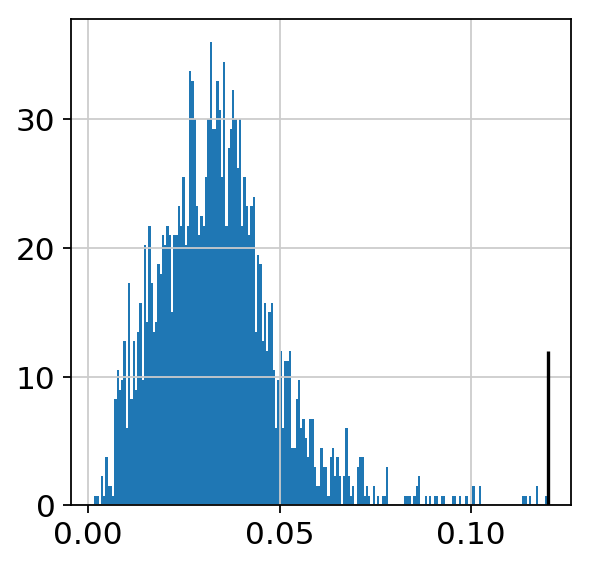

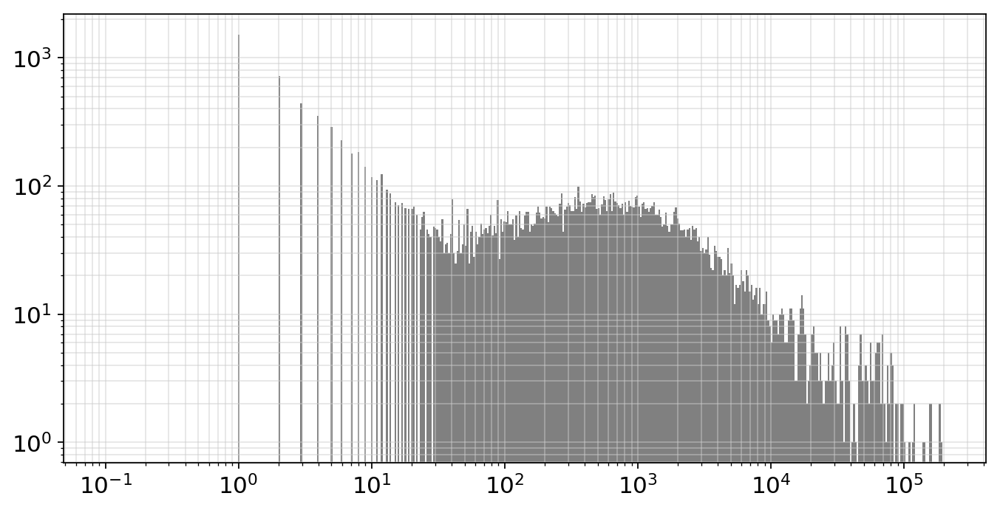

In [187]:
adata4.obs['percent_mito'] = np.ravel(np.sum(adata4[:, mito_genes_mouse].X, axis=1)) / np.ravel(np.sum(adata4.X, axis=1))

plt.hist(adata4.obs['percent_mito'].values,bins=200,density=True);
plt.vlines(0.12,0,12);

adata4 = adata4[adata4.obs['percent_mito'] < 0.12].copy()

def my_plot(ax, vals, tupe=None, thresh=None, max_y=None, low=1e-1, hi=2e5):
    ax.hist(vals,bins=np.logspace(np.log10(low),np.log10(hi), 500),color='gray') # logspace bins looks great!
    ax.set_yscale('log')
    ax.set_xscale('log')
    ax.set_title(tupe)
    ax.grid(which='both', alpha=0.5)
    if thresh != None:
        ax.vlines(thresh,0,max_y)
    return

fig, ax = plt.subplots(figsize=(10,5))
vals = sc.pp.filter_genes(adata4, min_counts=0, inplace=False)[1] # total number of UMIs observed
my_plot(ax, vals)

filtered out 18013 genes that are detectedin less than 40 counts
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


... storing 'feature_types' as categorical
... storing 'genome' as categorical


Standardizing Data across genes.

Found 3 batches

Found 0 numerical variables:
	

Fitting L/S model and finding priors

Finding parametric adjustments

Adjusting data

extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
6048 0.6057085628442664


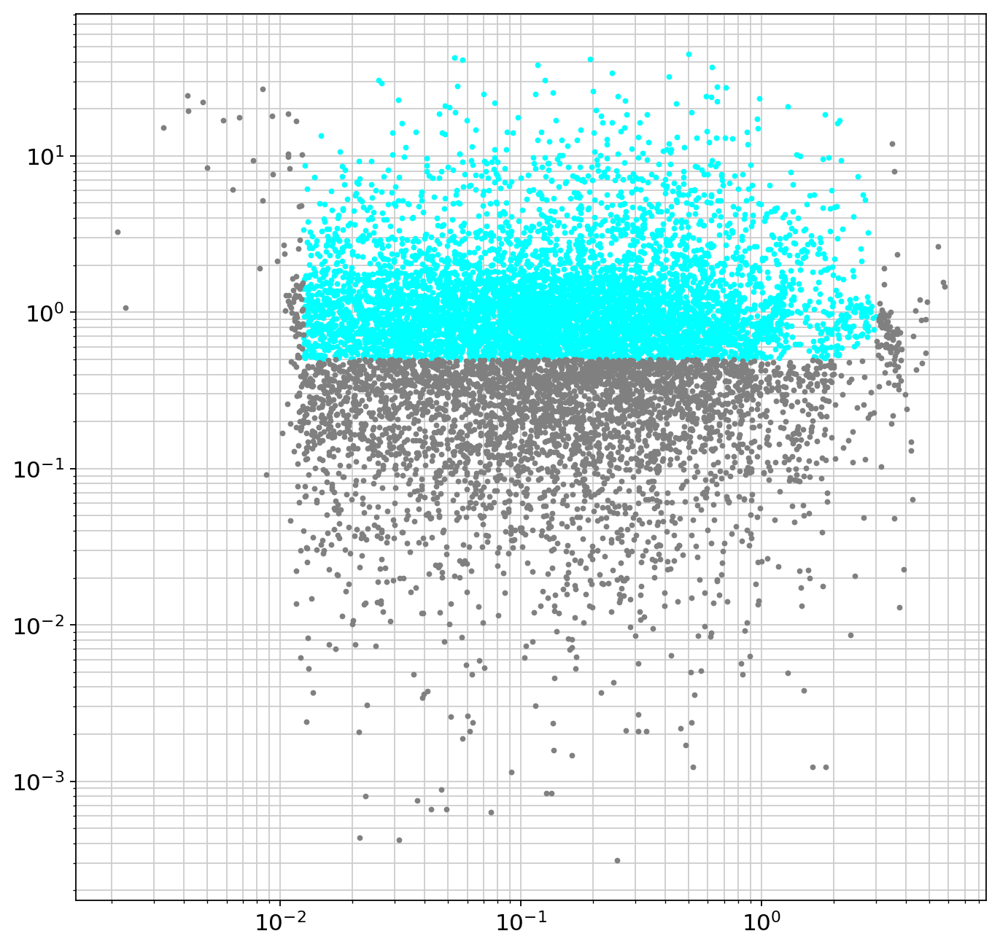

In [188]:
sc.pp.filter_genes(adata4, min_counts=40, inplace=True)

sc.pp.log1p(adata4)
sc.pp.normalize_per_cell(adata4)

warnings.filterwarnings('ignore')
sc.pp.combat(adata4)
warnings.filterwarnings('default')

warnings.filterwarnings('ignore')
sc.pp.highly_variable_genes(adata4, flavor='cell_ranger',inplace=True) # use default setting first to visualize
warnings.filterwarnings('default')
a = sum(adata4.var['highly_variable'].values)
print(a, a/len(adata4.var_names))

plt.figure(figsize=(10,10))
hv = adata4[:,adata4.var['highly_variable'] == True].copy()
nhv = adata4[:,adata4.var['highly_variable'] == False].copy()
plt.plot(hv.var['means'].values,hv.var['dispersions_norm'].values,marker='.', markersize=5, linewidth=0, color='cyan');
plt.plot(nhv.var['means'].values,nhv.var['dispersions_norm'].values,marker='.', markersize=5, linewidth=0, color='grey');
plt.yscale('log')
plt.xscale('log')
plt.grid(True,'both','both')

In [189]:
min_mean = 1e-1
min_disp = 5e-1

extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
3748 0.37536304456685027


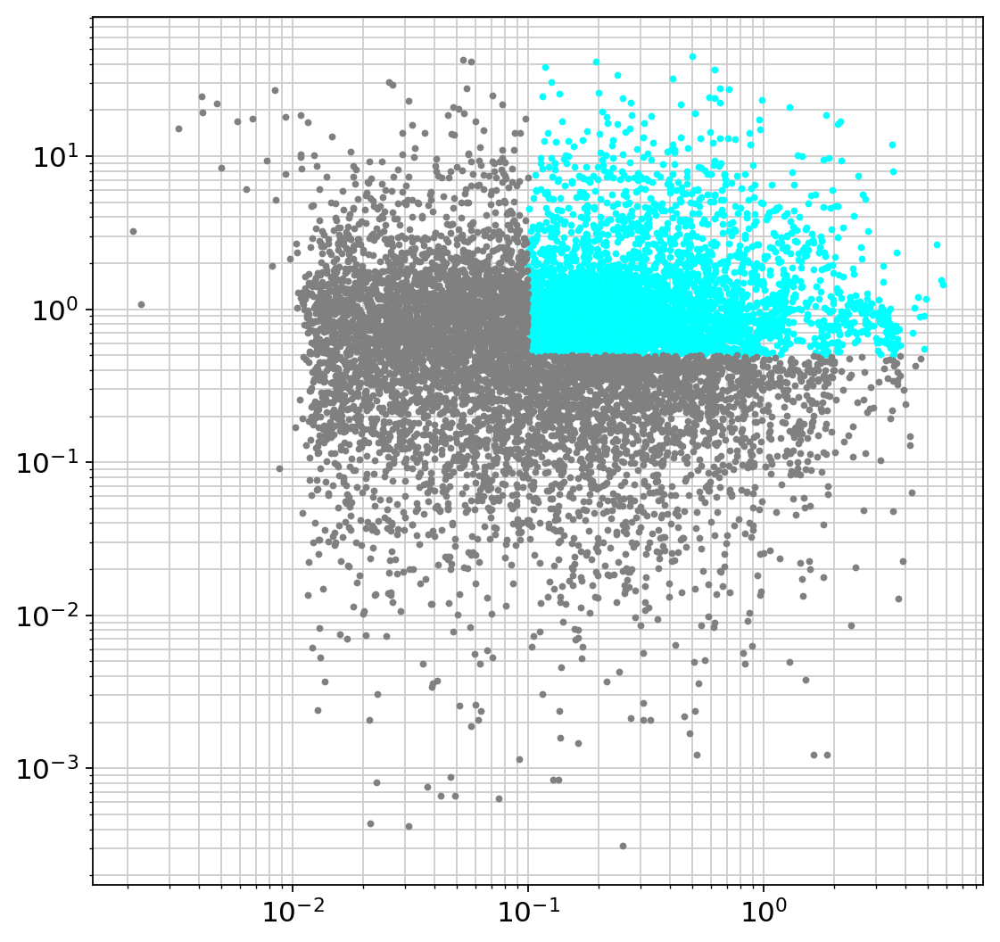

In [190]:
warnings.filterwarnings('ignore')
sc.pp.highly_variable_genes(adata4, flavor='cell_ranger',inplace=True, min_mean=min_mean, min_disp=min_disp, max_mean=np.inf) # use default setting first to visualize
warnings.filterwarnings('default')
a = sum(adata4.var['highly_variable'].values)
print(a, a/len(adata4.var_names))

plt.figure(figsize=(8,8))
hv = adata4[:,adata4.var['highly_variable'] == True].copy()
nhv = adata4[:,adata4.var['highly_variable'] == False].copy()
plt.plot(hv.var['means'].values,hv.var['dispersions_norm'].values,marker='.', markersize=5, linewidth=0, color='cyan');
plt.plot(nhv.var['means'].values,nhv.var['dispersions_norm'].values,marker='.', markersize=5, linewidth=0, color='grey');
plt.yscale('log')
plt.xscale('log')
plt.grid(True,'both','both')

Cool, seems reasonable.

In [192]:
warnings.filterwarnings('ignore')
sc.pp.highly_variable_genes(adata4, flavor='cell_ranger',inplace=True, subset=True, min_mean=min_mean, min_disp=min_disp, max_mean=np.inf) # use default setting first to visualize
warnings.filterwarnings('default')

extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


In [193]:
warnings.filterwarnings('ignore')
sc.pp.regress_out(adata4,['percent_mito','n_counts'],n_jobs=8)
warnings.filterwarnings('default')
sc.pp.scale(adata4, max_value=10)

regressing out ['percent_mito', 'n_counts']
    finished (0:00:02)


# Dim Reduction

Note that scikit-learn's randomized PCA might not be exactly reproducible across different computational platforms. For exact reproducibility, choose `svd_solver='arpack'.` This will likely become the Scanpy default in the future.
computing PCA with n_comps = 100
computing PCA on highly variable genes
    finished (0:00:00)


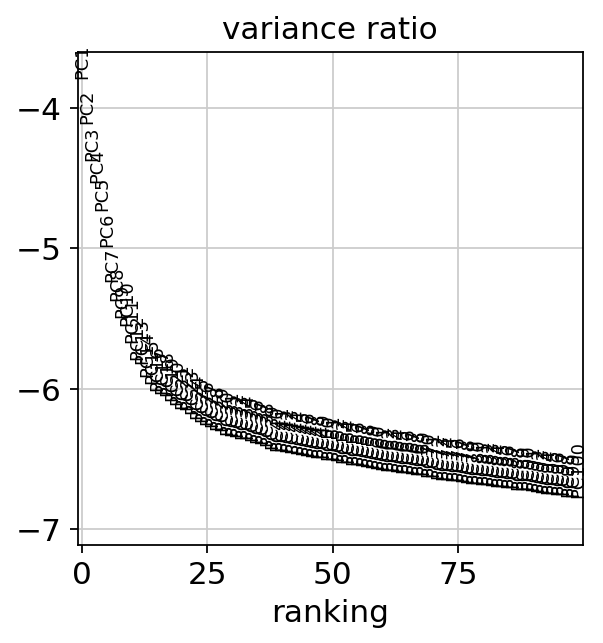

In [195]:
sc.pp.pca(adata4,n_comps=100)
sc.pl.pca_variance_ratio(adata4,log=True, n_pcs=100)

In [220]:
warnings.filterwarnings('ignore')
sc.pp.neighbors(adata4,n_neighbors=15,n_pcs=30) # numba warning outlined here is not to be of concern: https://github.com/lmcinnes/umap/issues/252
warnings.filterwarnings('default')
sc.tl.leiden(adata4,resolution=0.3)
sc.tl.umap(adata4)

computing neighbors
    using 'X_pca' with n_pcs = 30
    finished: added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix (0:00:00)
running Leiden clustering
    finished: found 3 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:05)


In [213]:
sc.tl.leiden(adata4,resolution=0.3)

running Leiden clustering
    finished: found 3 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


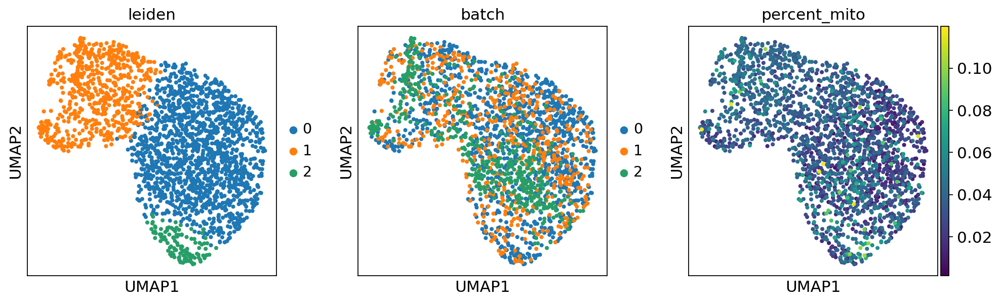

In [221]:
sc.pl.umap(adata4,color=['leiden','batch','percent_mito'])

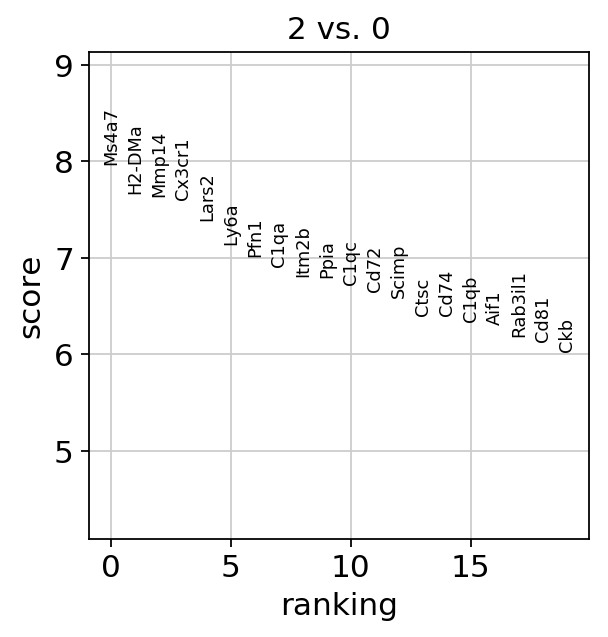

In [222]:
sc.settings.verbosity = 0 
warnings.filterwarnings('ignore')
sc.tl.rank_genes_groups(adata4,groupby='leiden', groups=['2'],reference='0')
warnings.filterwarnings('default')
sc.pl.rank_genes_groups(adata4)
sc.settings.verbosity = 3

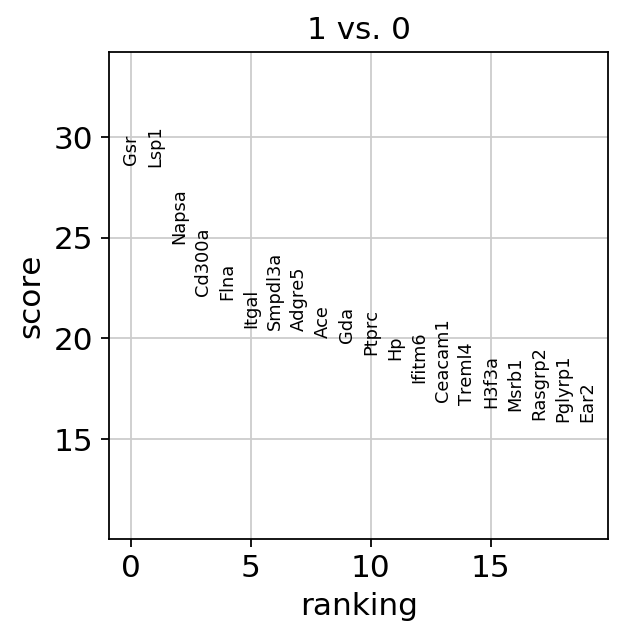

In [223]:
sc.settings.verbosity = 0 
warnings.filterwarnings('ignore')
sc.tl.rank_genes_groups(adata4,groupby='leiden', groups=['1'],reference='0')
warnings.filterwarnings('default')
sc.pl.rank_genes_groups(adata4)
sc.settings.verbosity = 3

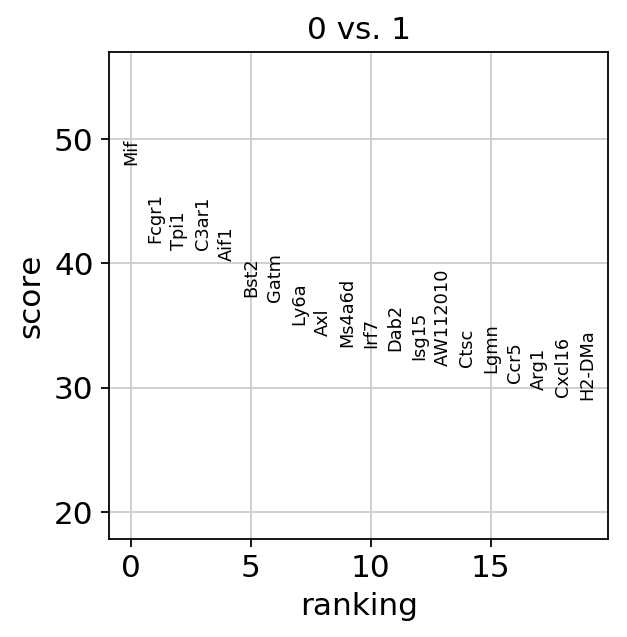

In [224]:
sc.settings.verbosity = 0 
warnings.filterwarnings('ignore')
sc.tl.rank_genes_groups(adata4,groupby='leiden', groups=['0'],reference='1')
warnings.filterwarnings('default')
sc.pl.rank_genes_groups(adata4)
sc.settings.verbosity = 3

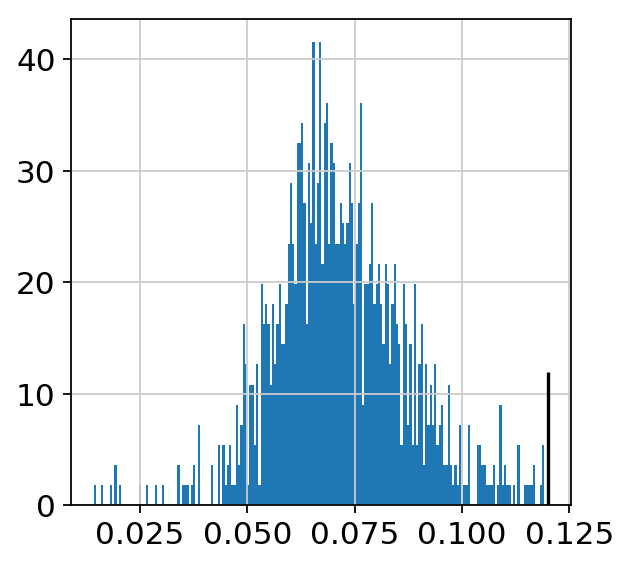

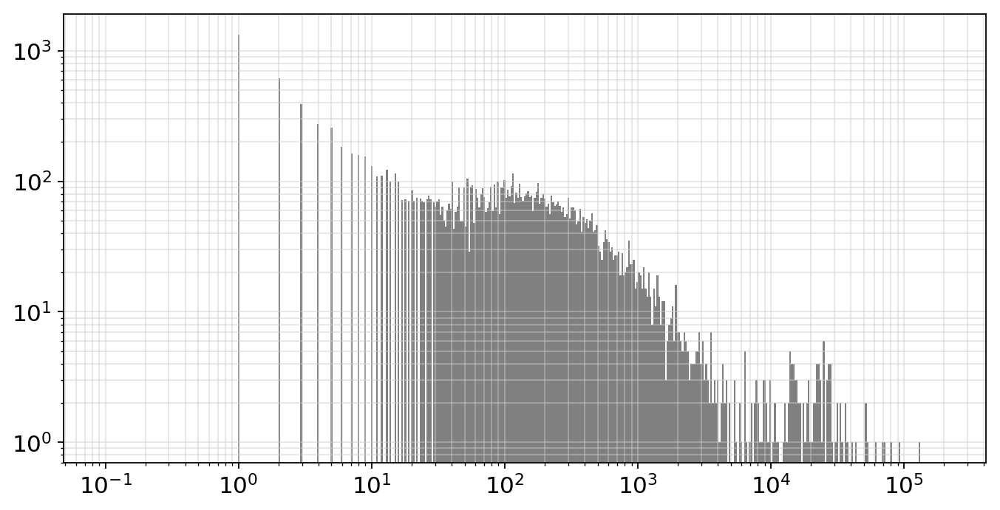

In [226]:
adata5.obs['percent_mito'] = np.ravel(np.sum(adata5[:, mito_genes_mouse].X, axis=1)) / np.ravel(np.sum(adata5.X, axis=1))

plt.hist(adata5.obs['percent_mito'].values,bins=200,density=True);
plt.vlines(0.12,0,12);

adata5 = adata5[adata5.obs['percent_mito'] < 0.12].copy()

def my_plot(ax, vals, tupe=None, thresh=None, max_y=None, low=1e-1, hi=2e5):
    ax.hist(vals,bins=np.logspace(np.log10(low),np.log10(hi), 500),color='gray') # logspace bins looks great!
    ax.set_yscale('log')
    ax.set_xscale('log')
    ax.set_title(tupe)
    ax.grid(which='both', alpha=0.5)
    if thresh != None:
        ax.vlines(thresh,0,max_y)
    return

fig, ax = plt.subplots(figsize=(10,5))
vals = sc.pp.filter_genes(adata5, min_counts=0, inplace=False)[1] # total number of UMIs observed
my_plot(ax, vals)

filtered out 20751 genes that are detectedin less than 40 counts
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


... storing 'feature_types' as categorical
... storing 'genome' as categorical


Standardizing Data across genes.

Found 3 batches

Found 0 numerical variables:
	

Fitting L/S model and finding priors

Finding parametric adjustments

Adjusting data

extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
4423 0.6103215123499379


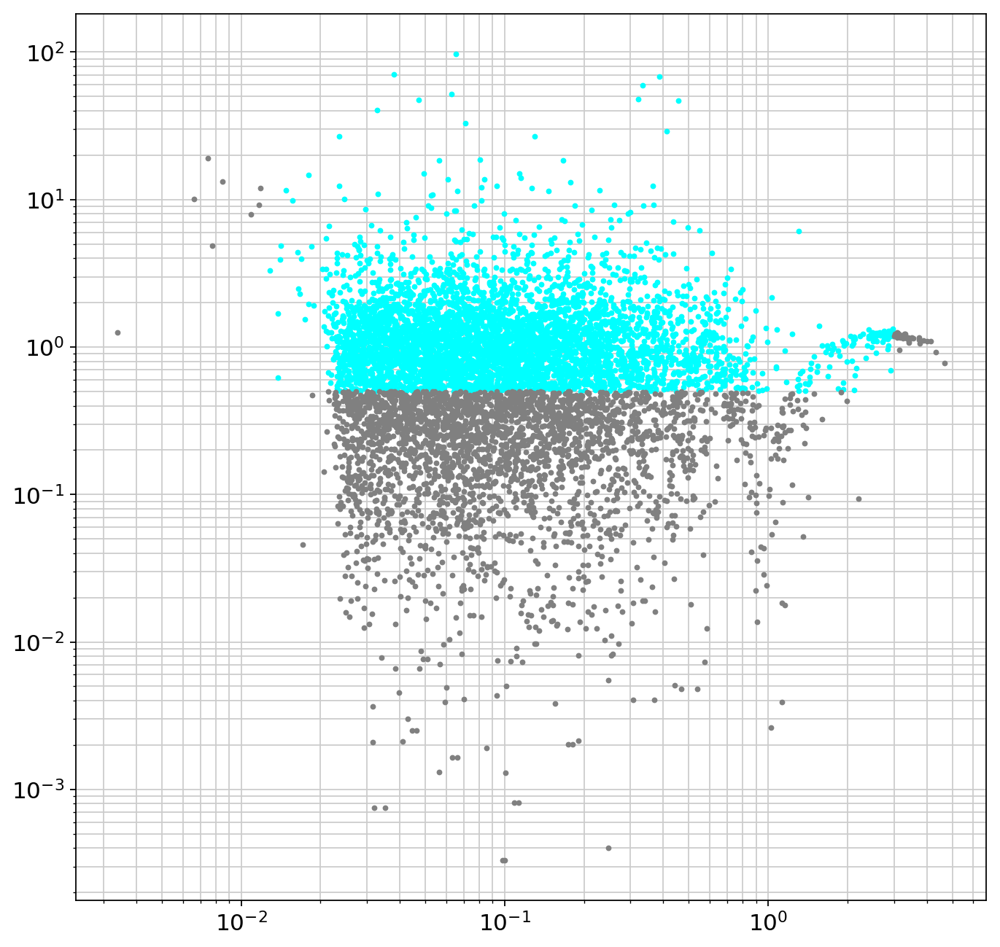

In [227]:
sc.pp.filter_genes(adata5, min_counts=40, inplace=True)

sc.pp.log1p(adata5)
sc.pp.normalize_per_cell(adata5)

warnings.filterwarnings('ignore')
sc.pp.combat(adata5)
warnings.filterwarnings('default')

warnings.filterwarnings('ignore')
sc.pp.highly_variable_genes(adata5, flavor='cell_ranger',inplace=True) # use default setting first to visualize
warnings.filterwarnings('default')
a = sum(adata5.var['highly_variable'].values)
print(a, a/len(adata5.var_names))

plt.figure(figsize=(10,10))
hv = adata5[:,adata5.var['highly_variable'] == True].copy()
nhv = adata5[:,adata5.var['highly_variable'] == False].copy()
plt.plot(hv.var['means'].values,hv.var['dispersions_norm'].values,marker='.', markersize=5, linewidth=0, color='cyan');
plt.plot(nhv.var['means'].values,nhv.var['dispersions_norm'].values,marker='.', markersize=5, linewidth=0, color='grey');
plt.yscale('log')
plt.xscale('log')
plt.grid(True,'both','both')

In [234]:
min_mean = 1e-1
min_disp = 3.5e-1

extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
2475 0.34152062922588655


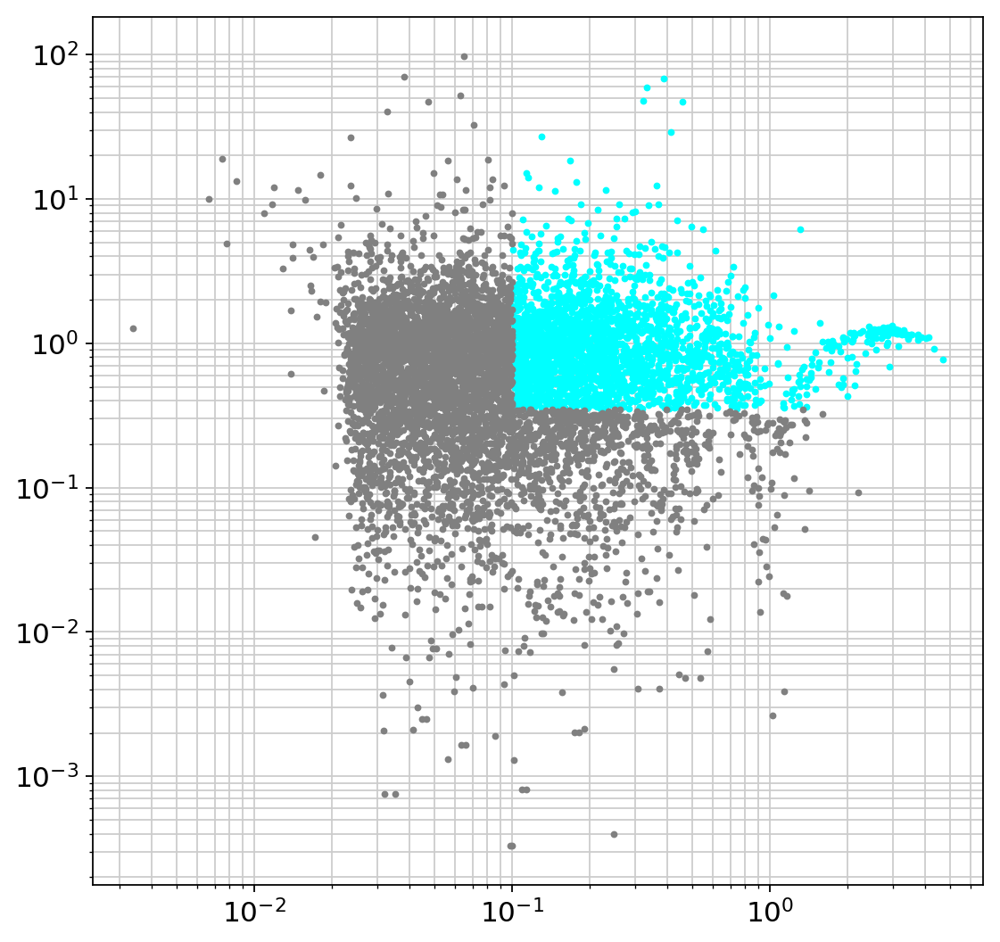

In [235]:
warnings.filterwarnings('ignore')
sc.pp.highly_variable_genes(adata5, flavor='cell_ranger',inplace=True, min_mean=min_mean, min_disp=min_disp, max_mean=np.inf) # use default setting first to visualize
warnings.filterwarnings('default')
a = sum(adata5.var['highly_variable'].values)
print(a, a/len(adata5.var_names))

plt.figure(figsize=(8,8))
hv = adata5[:,adata5.var['highly_variable'] == True].copy()
nhv = adata5[:,adata5.var['highly_variable'] == False].copy()
plt.plot(hv.var['means'].values,hv.var['dispersions_norm'].values,marker='.', markersize=5, linewidth=0, color='cyan');
plt.plot(nhv.var['means'].values,nhv.var['dispersions_norm'].values,marker='.', markersize=5, linewidth=0, color='grey');
plt.yscale('log')
plt.xscale('log')
plt.grid(True,'both','both')

Cool, seems reasonable.

In [237]:
warnings.filterwarnings('ignore')
sc.pp.highly_variable_genes(adata5, flavor='cell_ranger',inplace=True, subset=True, min_mean=min_mean, min_disp=min_disp, max_mean=np.inf) # use default setting first to visualize
warnings.filterwarnings('default')

extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


In [238]:
warnings.filterwarnings('ignore')
sc.pp.regress_out(adata5,['percent_mito','n_counts'],n_jobs=8)
warnings.filterwarnings('default')
sc.pp.scale(adata4, max_value=10)

regressing out ['percent_mito', 'n_counts']
    finished (0:00:01)


# Dim Reduction

Note that scikit-learn's randomized PCA might not be exactly reproducible across different computational platforms. For exact reproducibility, choose `svd_solver='arpack'.` This will likely become the Scanpy default in the future.
computing PCA with n_comps = 100
computing PCA on highly variable genes
    finished (0:00:00)


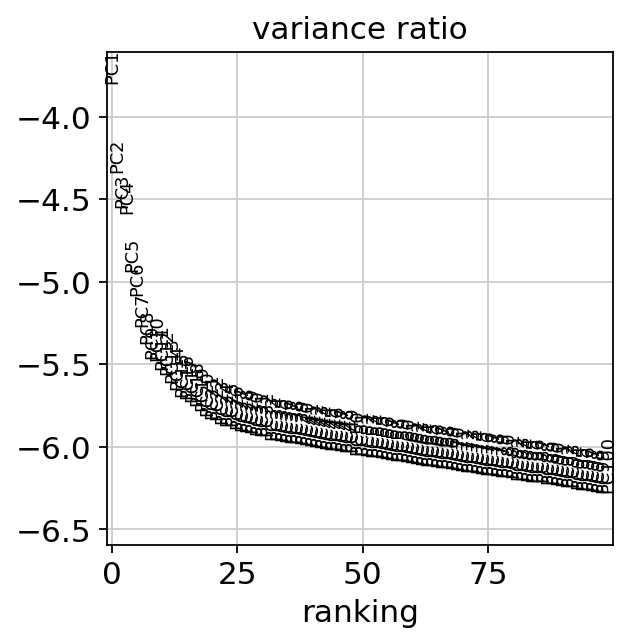

In [239]:
sc.pp.pca(adata5,n_comps=100)
sc.pl.pca_variance_ratio(adata5,log=True, n_pcs=100)

In [241]:
warnings.filterwarnings('ignore')
sc.pp.neighbors(adata5,n_neighbors=15,n_pcs=25) # numba warning outlined here is not to be of concern: https://github.com/lmcinnes/umap/issues/252
warnings.filterwarnings('default')
sc.tl.leiden(adata5,resolution=0.3)
sc.tl.umap(adata5)

computing neighbors
    using 'X_pca' with n_pcs = 25
    finished: added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix (0:00:00)
running Leiden clustering
    finished: found 4 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:02)


In [245]:
sc.tl.leiden(adata5,resolution=0.3)

running Leiden clustering
    finished: found 4 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


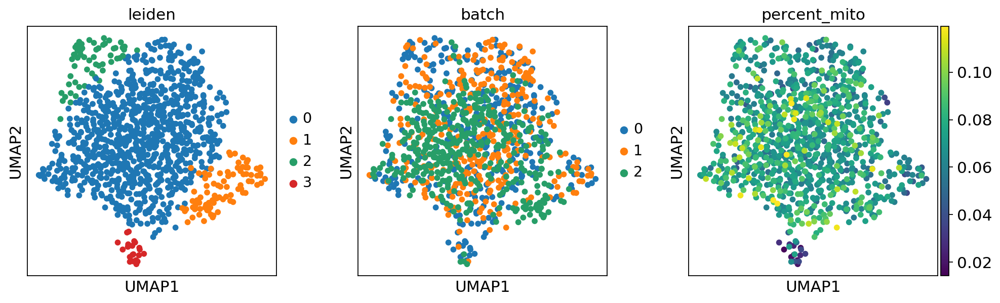

In [246]:
sc.pl.umap(adata5,color=['leiden','batch','percent_mito'])

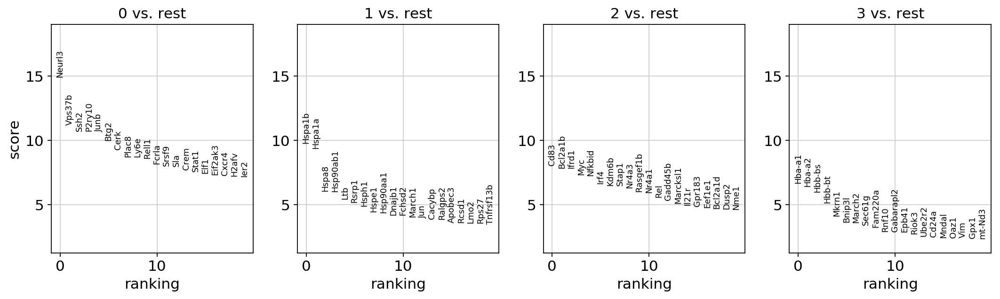

In [249]:
sc.settings.verbosity = 0 
warnings.filterwarnings('ignore')
sc.tl.rank_genes_groups(adata5,groupby='leiden')
warnings.filterwarnings('default')
sc.pl.rank_genes_groups(adata5)
sc.settings.verbosity = 3

**3:** classical DC1, Cd24+ and Naaa+
**2:** Eosinophil or megakaryocyte?

In [142]:
cts = list()
for i in adata2.obs['leiden']:
    if i in ['5','6','3']:
        cts.append('ct1')
    elif i in ['0']:
        cts.append('ct2')
    elif i in ['1']:
        cts.append('ct3')
    elif i in ['2']:
        cts.append('ct4')
    elif i in ['4']:
        cts.append('ct5')
    elif i in ['7']:
        cts.append('ct6')
    elif i in ['8']:
        cts.append('ct7')
    elif i in ['9']:
        cts.append('ct8')
    elif i in ['10']:
        cts.append('ct9')

adata2.obs['cts'] = cts
adata2.obs['cts'] = adata2.obs['cts'].astype('category')

In [135]:
[i for i in adata2.var_names if 'Il' in i]sc.pl.umap(adata3,color=['leiden','batch','percent_mito'])

['Il18r1',
 'Il18rap',
 'Il2ra',
 'Ilf2',
 'Il12rb2',
 'Il17ra',
 'Il16',
 'Ilk',
 'Il4ra',
 'Il21r',
 'Il10ra',
 'Il6st',
 'Il7r',
 'Il2rb']

Crazy relevance: https://www.sciencedirect.com/science/article/pii/0006295296003425

In [254]:
ct_to_celltype = {'ct1':'RBCs','ct2':'Ts+NKs','ct3':'DC/Mye','ct4':'Mphage','ct5':'Bs','ct6':'Liver','ct7':'Neutrophils','ct8':'Mast'}

In [256]:
adata.obs['celltypes'] = adata.obs['cts'].map(ct_to_celltype)

In [300]:
[i for i in adata.var_names if 'Cx' in i]

['Cxcl2', 'Cxcl9', 'Cxcl10', 'Cxcr6', 'Cxcl16']

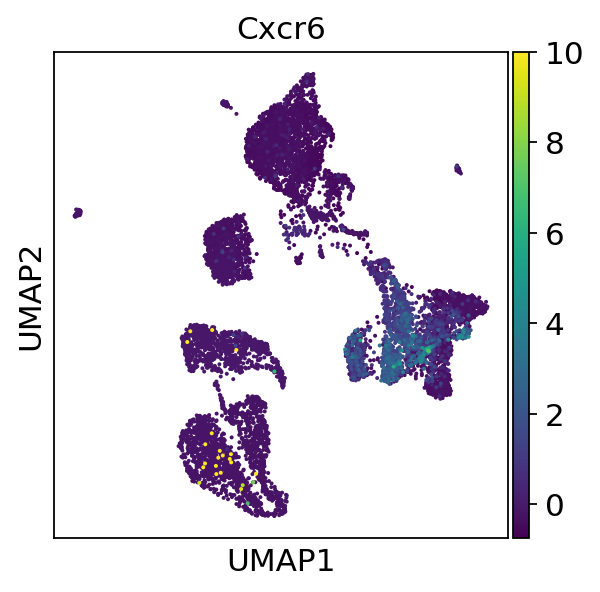

In [301]:
sc.pl.umap(adata, color='Cxcr6')

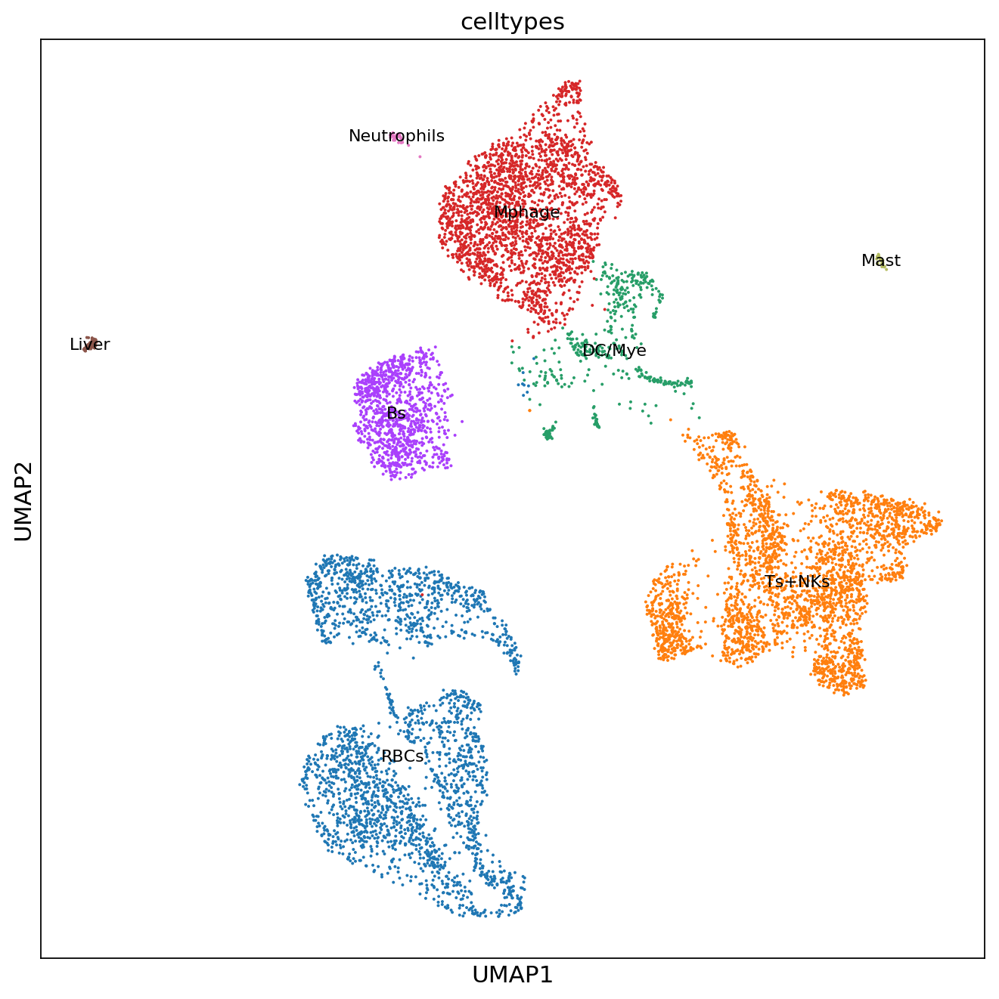

In [272]:
fig, ax = plt.subplots(figsize=(10,10))
sc.pl.umap(adata, color='celltypes',ax=ax,show=False,return_fig=False,legend_loc='on data', legend_fontweight=None, legend_fontsize=10);